In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

In [2]:
df = pd.read_pickle("../../data/interim/01_data_processed.pkl")

In [3]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,71
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,71
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,71


In [4]:
df = df[df["label"] != "rest"]

In [5]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,71
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,71
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,71


In [7]:
acc_r = df["acc_x"] ** 2 + df["acc_y"] ** 2 + df["acc_z"] ** 2

In [8]:
gyr_r = df["gyr_x"] ** 2 + df["gyr_y"] ** 2 + df["gyr_z"] ** 2

In [11]:
acc_r

epoch (ms)
2019-01-11 15:08:05.200    0.959752
2019-01-11 15:08:05.400    0.948193
2019-01-11 15:08:05.600    0.948277
2019-01-11 15:08:05.800    0.921827
2019-01-11 15:08:06.000    0.931134
                             ...   
2019-01-20 17:33:27.000    1.092879
2019-01-20 17:33:27.200    1.065800
2019-01-20 17:33:27.400    1.073285
2019-01-20 17:33:27.600    1.055482
2019-01-20 17:33:27.800    1.074573
Length: 7899, dtype: float64

In [12]:
gyr_r

epoch (ms)
2019-01-11 15:08:05.200    10.404654
2019-01-11 15:08:05.400     8.336328
2019-01-11 15:08:05.600     8.624326
2019-01-11 15:08:05.800    89.747245
2019-01-11 15:08:06.000    21.377539
                             ...    
2019-01-20 17:33:27.000    33.691343
2019-01-20 17:33:27.200    13.042268
2019-01-20 17:33:27.400    34.449584
2019-01-20 17:33:27.600     1.378254
2019-01-20 17:33:27.800    18.350756
Length: 7899, dtype: float64

In [14]:
df["acc_r"] = np.sqrt(acc_r)

<ipython-input-14-10b3676be9c6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["acc_r"] = np.sqrt(acc_r)


In [15]:
df.loc[:, "acc_r"] = np.sqrt(df["acc_r"])

In [16]:
df.loc[:, "acc_r"]

epoch (ms)
2019-01-11 15:08:05.200    0.989783
2019-01-11 15:08:05.400    0.986789
2019-01-11 15:08:05.600    0.986811
2019-01-11 15:08:05.800    0.979856
2019-01-11 15:08:06.000    0.982320
                             ...   
2019-01-20 17:33:27.000    1.022452
2019-01-20 17:33:27.200    1.016059
2019-01-20 17:33:27.400    1.017838
2019-01-20 17:33:27.600    1.013591
2019-01-20 17:33:27.800    1.018143
Name: acc_r, Length: 7899, dtype: float64

In [17]:
df["gyr_r"] = np.sqrt(gyr_r)

<ipython-input-17-ff70734953e7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["gyr_r"] = np.sqrt(gyr_r)


In [18]:
df.loc[:, "gyr_r"] = np.sqrt(df["gyr_r"])

In [19]:
df.loc[:, "gyr_r"]

epoch (ms)
2019-01-11 15:08:05.200    1.796002
2019-01-11 15:08:05.400    1.699197
2019-01-11 15:08:05.600    1.713686
2019-01-11 15:08:05.800    3.077906
2019-01-11 15:08:06.000    2.150252
                             ...   
2019-01-20 17:33:27.000    2.409237
2019-01-20 17:33:27.200    1.900370
2019-01-20 17:33:27.400    2.422680
2019-01-20 17:33:27.600    1.083508
2019-01-20 17:33:27.800    2.069729
Name: gyr_r, Length: 7899, dtype: float64

In [20]:
bench_df = df[df["label"] == "bench"]
squat_df = df[df["label"] == "squat"]
row_df = df[df["label"] == "row"]
ohp_df = df[df["label"] =="ohp"]
dead_df = df[df["label"] == "dead"]

In [21]:
bench_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.890400,2.439200,0.9388,B,bench,heavy,64,0.989783,1.796002
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.682600,-0.890400,2.1708,B,bench,heavy,64,0.986789,1.699197
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.560800,-0.256000,-1.4146,B,bench,heavy,64,0.986811,1.713686
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.061000,-4.524400,-2.0730,B,bench,heavy,64,0.979856,3.077906
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.439000,-1.548600,-3.6098,B,bench,heavy,64,0.982320,2.150252
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-19 17:24:41.800,0.013000,1.026667,-0.096333,-1.268400,2.841600,2.0610,E,bench,medium,66,1.015509,1.931957
2019-01-19 17:24:42.000,0.017500,0.955000,-0.075000,0.451200,0.024400,0.5242,E,bench,medium,66,0.978826,0.831908
2019-01-19 17:24:42.200,0.023667,0.964000,-0.086333,1.475600,-0.024200,1.5974,E,bench,medium,66,0.983945,1.474714


In [22]:
squat_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,A,squat,medium,69,1.010240,1.751573
2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,A,squat,medium,69,0.964928,1.447355
2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,A,squat,medium,69,1.005485,1.121142
2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,A,squat,medium,69,0.973281,2.759365
2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,A,squat,medium,69,0.990608,2.267151
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-18 17:04:06.800,0.123000,0.802333,0.541333,3.9510,-1.1220,0.4634,D,squat,heavy,88,0.987754,2.033048
2019-01-18 17:04:07.000,0.118500,0.812500,0.535000,-3.4390,-0.8536,0.6222,D,squat,heavy,88,0.989956,1.896725
2019-01-18 17:04:07.200,0.116000,0.801000,0.543333,-1.3172,-0.7806,1.4754,D,squat,heavy,88,0.987328,1.458184


In [23]:
row_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-14 14:01:40.000,-0.037000,-0.854000,0.271000,-31.8172,-1.6830,-6.3660,C,row,medium,3,0.946959,5.700125
2019-01-14 14:01:40.200,-0.042500,-0.884000,0.174000,-56.3416,-8.3172,-9.9388,C,row,medium,3,0.949718,7.603479
2019-01-14 14:01:40.400,-0.008333,-0.967667,0.030333,-31.4388,-3.0732,0.9266,C,row,medium,3,0.983960,5.621587
2019-01-14 14:01:40.600,-0.018500,-1.046500,-0.042500,-4.5244,-4.9632,1.3536,C,row,medium,3,1.023487,2.617436
2019-01-14 14:01:40.800,-0.031000,-1.098667,-0.062333,7.7318,1.9634,4.4878,C,row,medium,3,1.049224,3.025380
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,71,1.022452,2.409237
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,71,1.016059,1.900370
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,71,1.017838,2.422680


In [24]:
ohp_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:38:55.000,-0.062500,0.901000,0.047000,0.4390,-6.5000,-0.0854,A,ohp,heavy,80,0.950993,2.552522
2019-01-11 15:38:55.200,-0.080667,1.080667,0.060333,5.5976,-3.2196,-1.4266,A,ohp,heavy,80,1.041802,2.571610
2019-01-11 15:38:55.400,-0.137500,1.314000,0.024000,20.8534,7.7562,-44.1340,A,ohp,heavy,80,1.149518,7.030293
2019-01-11 15:38:55.600,-0.234667,0.910333,-0.007000,17.7684,11.4880,-35.0002,A,ohp,heavy,80,0.969597,6.395210
2019-01-11 15:38:55.800,-0.337000,0.861000,-0.095500,2.3778,2.2682,-4.6220,A,ohp,heavy,80,0.964117,2.381410
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-15 13:55:56.600,-0.218667,1.206667,-0.129333,-32.1462,-11.7194,35.2438,E,ohp,heavy,38,1.110460,7.008620
2019-01-15 13:55:56.800,-0.095500,1.135500,-0.097000,27.0488,-2.8536,-0.0976,E,ohp,heavy,38,1.069406,5.215274
2019-01-15 13:55:57.000,-0.122667,0.944000,-0.114000,-15.6584,-3.2318,-4.2560,E,ohp,heavy,38,0.979152,4.067579


In [25]:
dead_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,A,dead,medium,57,1.020678,2.201560
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,A,dead,medium,57,1.019458,5.811070
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,A,dead,medium,57,1.015562,1.995893
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,A,dead,medium,57,1.019055,1.901779
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,A,dead,medium,57,1.016895,3.172468
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-16 19:35:42.800,0.015000,-1.083000,-0.164500,-0.341600,-6.3658,2.390200,E,dead,heavy,82,1.046673,2.609275
2019-01-16 19:35:43.000,-0.007000,-1.308000,-0.209333,4.939000,31.2440,-21.219400,E,dead,heavy,82,1.150940,6.171705
2019-01-16 19:35:43.200,0.161500,-1.003000,-0.113500,-4.427000,7.7680,12.585400,E,dead,heavy,82,1.011059,3.929125


In [26]:
plot_df = squat_df

In [28]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"]

epoch (ms)
2019-01-11 16:05:44.600    0.135333
2019-01-11 16:05:44.800    0.097500
2019-01-11 16:05:45.000    0.148667
2019-01-11 16:05:45.200    0.138000
2019-01-11 16:05:45.400    0.131667
                             ...   
2019-01-11 16:05:59.800    0.185333
2019-01-11 16:06:00.000    0.172500
2019-01-11 16:06:00.200    0.173667
2019-01-11 16:06:00.400    0.088500
2019-01-11 16:06:00.600    0.086500
Name: acc_x, Length: 81, dtype: float64

<Axes: xlabel='epoch (ms)'>

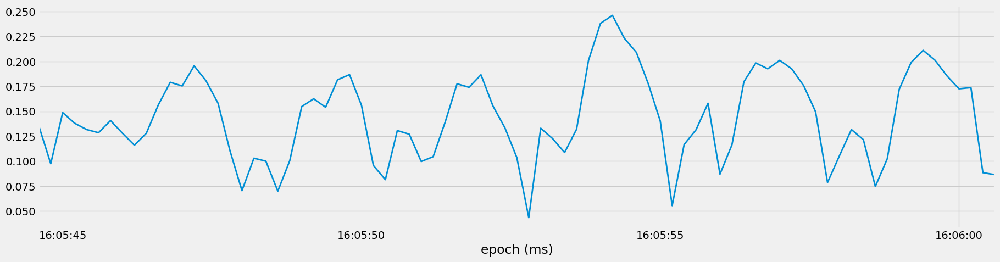

In [29]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()

<Axes: xlabel='epoch (ms)'>

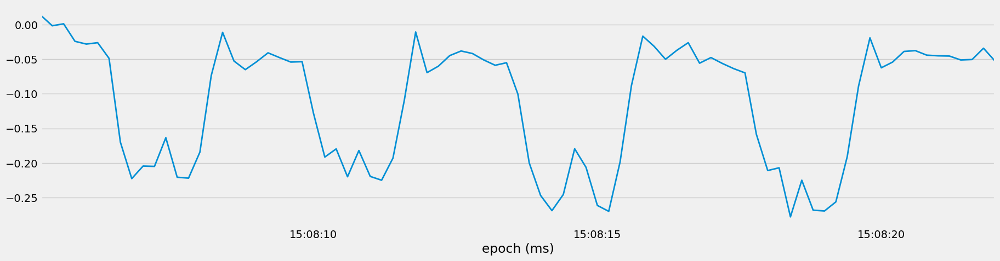

In [30]:
plot_df = bench_df
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()

In [31]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,64,0.980683,1.878567
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,64,0.991056,1.610252
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,64,0.989413,1.742013


<Axes: xlabel='epoch (ms)'>

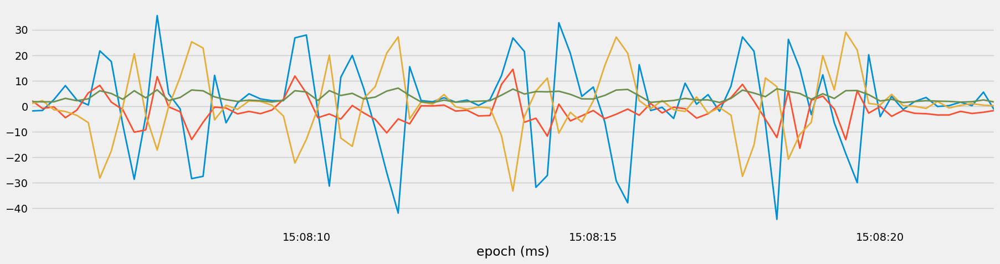

In [32]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()

<Axes: xlabel='epoch (ms)'>

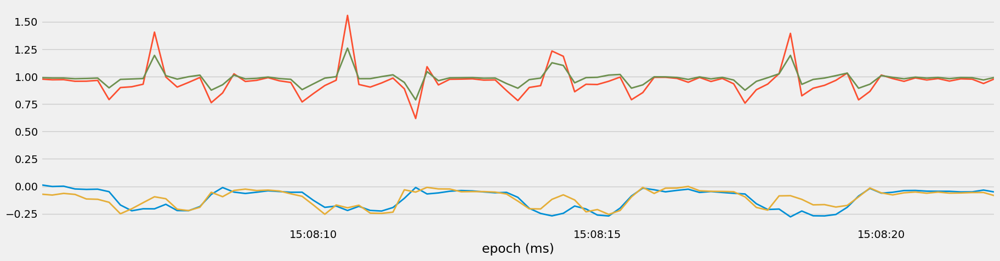

In [33]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

In [35]:
plot_df = squat_df

<Axes: xlabel='epoch (ms)'>

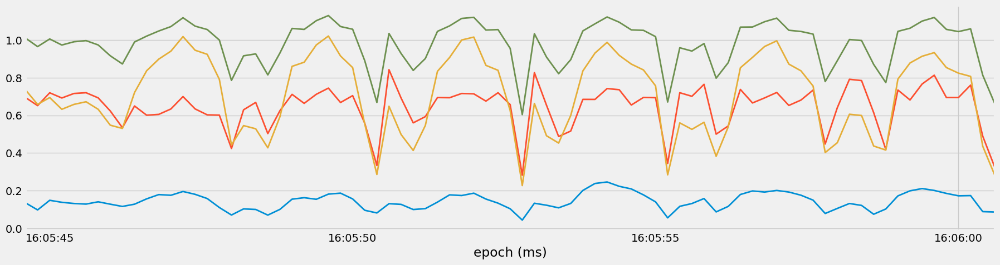

In [36]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

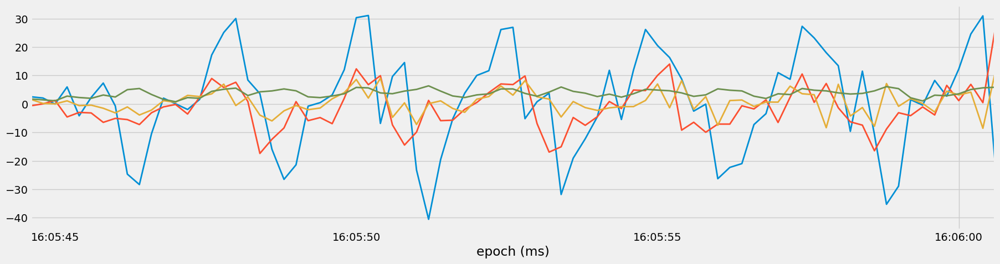

In [37]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()

In [38]:
fs = 1000 / 200

In [40]:
fs

5.0

In [41]:
LowPass = LowPassFilter()

In [42]:
bench_df[bench_df["set"] == bench_df["set"].unique()[0]]

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,64,0.980683,1.878567
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,64,0.991056,1.610252
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,64,0.989413,1.742013


In [43]:
bench_set = bench_df[bench_df["set"] == bench_df["set"].unique()[0]]

In [44]:
squat_set = squat_df[squat_df["set"] == squat_df["set"].unique()[0]]
row_set = row_df[row_df["set"] == row_df["set"].unique()[0]]
ohp_set = ohp_df[ohp_df["set"] == ohp_df["set"].unique()[0]]
dead_set = dead_df[dead_df["set"] == dead_df["set"].unique()[0]]

In [45]:
squat_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,A,squat,medium,69,1.010240,1.751573
2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,A,squat,medium,69,0.964928,1.447355
2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,A,squat,medium,69,1.005485,1.121142
2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,A,squat,medium,69,0.973281,2.759365
2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,A,squat,medium,69,0.990608,2.267151
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:05:59.800,0.185333,0.694667,0.853667,2.7318,6.5366,4.4998,A,squat,medium,69,1.056452,2.897022
2019-01-11 16:06:00.000,0.172500,0.694500,0.824000,12.2806,1.1708,3.1710,A,squat,medium,69,1.044681,3.568937
2019-01-11 16:06:00.200,0.173667,0.760333,0.806667,24.5852,6.8902,4.1584,A,squat,medium,69,1.059265,5.086146


In [46]:
row_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-14 14:01:40.000,-0.037000,-0.854000,0.271000,-31.8172,-1.683000,-6.3660,C,row,medium,3,0.946959,5.700125
2019-01-14 14:01:40.200,-0.042500,-0.884000,0.174000,-56.3416,-8.317200,-9.9388,C,row,medium,3,0.949718,7.603479
2019-01-14 14:01:40.400,-0.008333,-0.967667,0.030333,-31.4388,-3.073200,0.9266,C,row,medium,3,0.983960,5.621587
2019-01-14 14:01:40.600,-0.018500,-1.046500,-0.042500,-4.5244,-4.963200,1.3536,C,row,medium,3,1.023487,2.617436
2019-01-14 14:01:40.800,-0.031000,-1.098667,-0.062333,7.7318,1.963400,4.4878,C,row,medium,3,1.049224,3.025380
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-14 14:01:54.800,-0.063000,-1.138000,-0.129333,-1.0244,1.927000,-0.2194,C,row,medium,3,1.071008,1.481002
2019-01-14 14:01:55.000,-0.046500,-1.150500,-0.147500,-5.9512,-7.097400,0.7318,C,row,medium,3,1.077427,3.048138
2019-01-14 14:01:55.200,-0.060333,-1.095667,-0.107000,-5.8416,-8.951400,-0.7438,C,row,medium,3,1.050015,3.273334


In [47]:
ohp_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:38:55.000,-0.062500,0.901000,0.047000,0.439000,-6.500000,-0.085400,A,ohp,heavy,80,0.950993,2.552522
2019-01-11 15:38:55.200,-0.080667,1.080667,0.060333,5.597600,-3.219600,-1.426600,A,ohp,heavy,80,1.041802,2.571610
2019-01-11 15:38:55.400,-0.137500,1.314000,0.024000,20.853400,7.756200,-44.134000,A,ohp,heavy,80,1.149518,7.030293
2019-01-11 15:38:55.600,-0.234667,0.910333,-0.007000,17.768400,11.488000,-35.000200,A,ohp,heavy,80,0.969597,6.395210
2019-01-11 15:38:55.800,-0.337000,0.861000,-0.095500,2.377800,2.268200,-4.622000,A,ohp,heavy,80,0.964117,2.381410
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:39:09.200,-0.062333,1.201000,-0.006000,-13.475600,0.841400,27.244000,A,ohp,heavy,80,1.096646,5.514179
2019-01-11 15:39:09.400,0.022500,1.036500,0.028500,3.097400,-2.256000,-3.670600,A,ohp,heavy,80,1.018399,2.303539
2019-01-11 15:39:09.600,0.000000,0.953667,0.022333,-4.634200,-4.353600,-3.378200,A,ohp,heavy,80,0.976692,2.683306


In [48]:
dead_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,A,dead,medium,57,1.020678,2.201560
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,A,dead,medium,57,1.019458,5.811070
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,A,dead,medium,57,1.015562,1.995893
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,A,dead,medium,57,1.019055,1.901779
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,A,dead,medium,57,1.016895,3.172468
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:24:54.800,0.039000,-1.337500,-0.105500,-19.000000,18.5000,-3.829400,A,dead,medium,57,1.158543,5.176285
2019-01-11 16:24:55.000,0.081667,-1.006000,-0.094667,-15.719600,24.2926,13.695200,A,dead,medium,57,1.006846,5.657952
2019-01-11 16:24:55.200,0.033500,-1.052000,-0.185000,-0.060800,-4.8294,7.317200,A,dead,medium,57,1.033764,2.960988


<Axes: xlabel='epoch (ms)'>

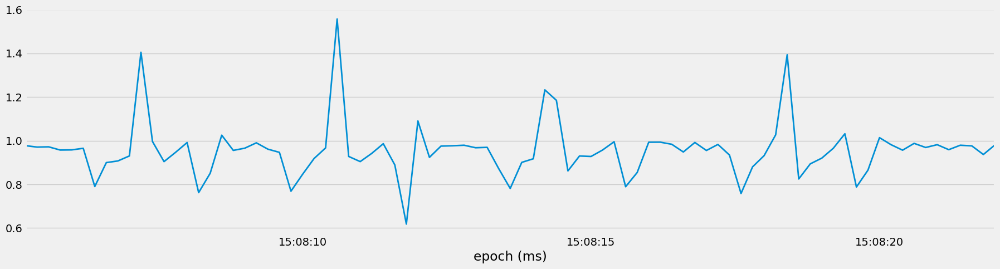

In [49]:
bench_set["acc_y"].plot()

In [52]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_y_lowpass
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002,0.974240
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197,0.953459
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686,0.936471
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906,0.925893
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252,0.923233
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,64,0.980683,1.878567,0.982579
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,64,0.991056,1.610252,0.986070
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,64,0.989413,1.742013,0.986568


<Axes: xlabel='epoch (ms)'>

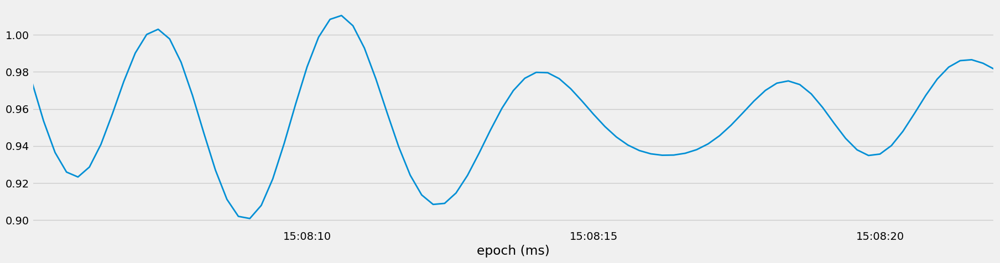

In [54]:
column = "acc_y"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

In [55]:
column = "acc_y"

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

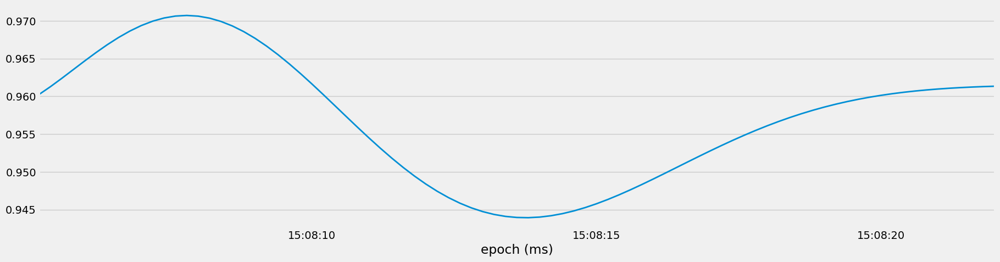

In [56]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.1, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

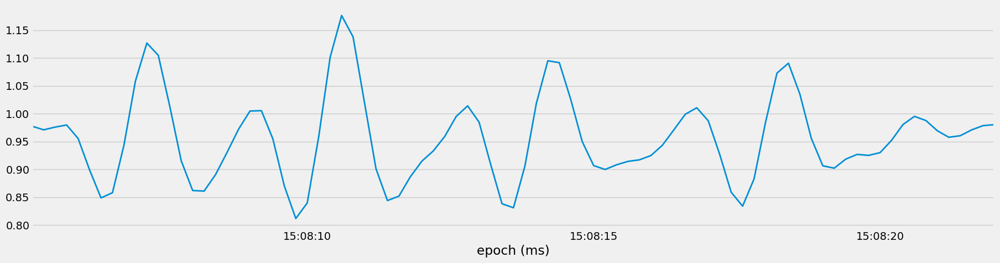

In [57]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.9, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

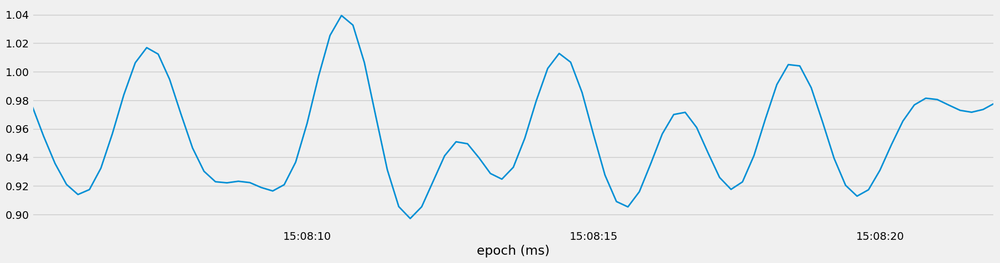

In [58]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.5, order=5
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

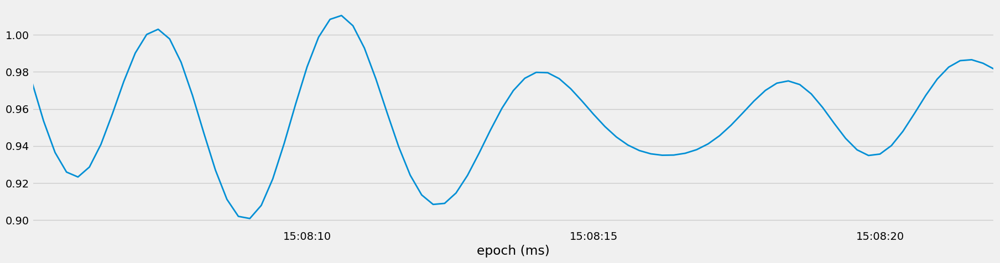

In [59]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

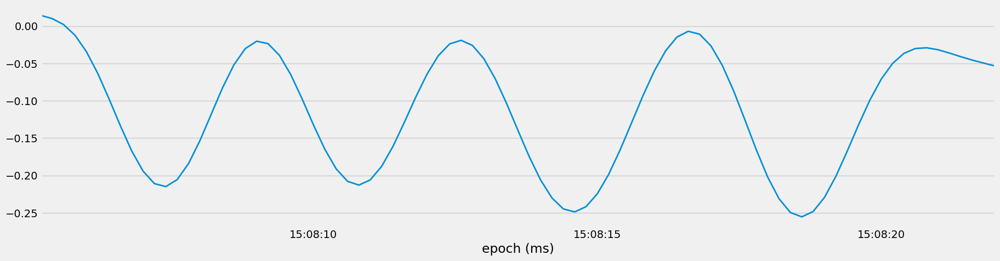

In [60]:
column = "acc_x"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

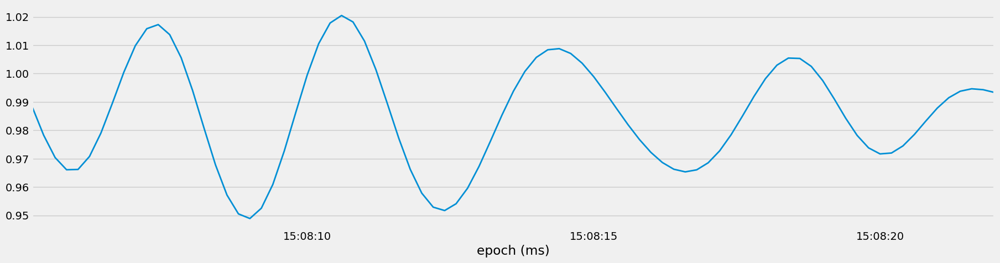

In [61]:
column = "acc_r"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

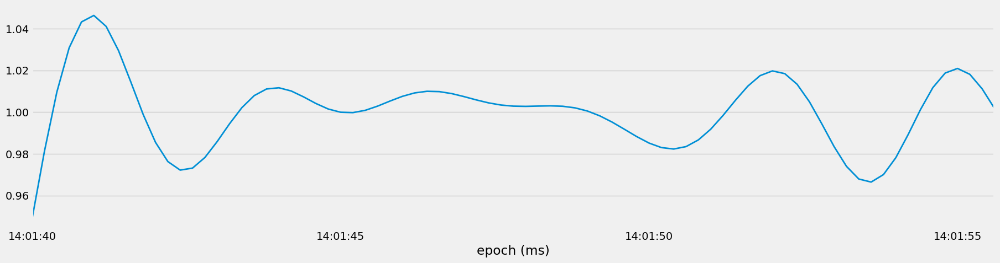

In [62]:
column = "acc_r"
LowPass.low_pass_filter(
    row_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

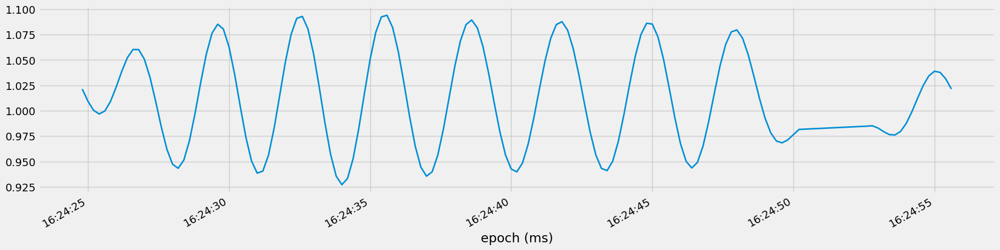

In [63]:
column = "acc_r"
LowPass.low_pass_filter(
    dead_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

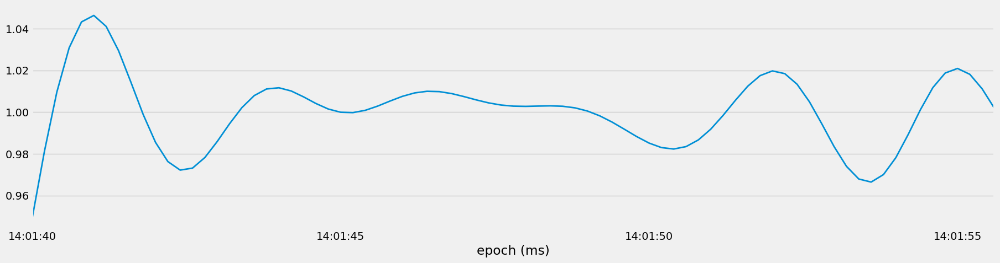

In [64]:
column = "acc_r"
LowPass.low_pass_filter(
    row_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

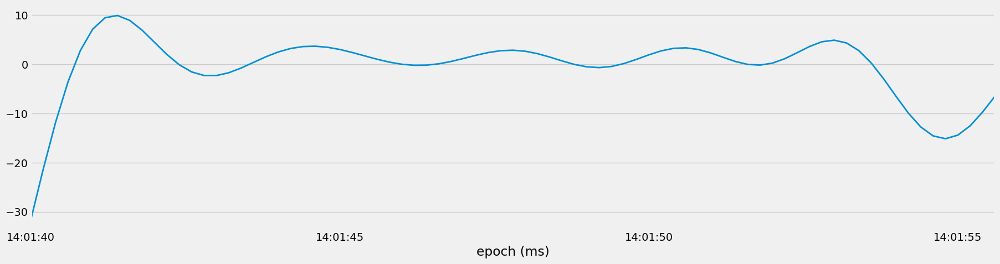

In [65]:
column = "gyr_x"
LowPass.low_pass_filter(
    row_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

In [66]:
argrelextrema(bench_set["acc_r"].values, np.greater)

(array([ 2,  5, 10, 14, 17, 20, 27, 31, 34, 38, 40, 45, 51, 54, 58, 60, 66,
        71, 74, 77, 79, 81]),)

In [72]:
column= "acc_y"

In [73]:
data = LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)

In [74]:
data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_y_lowpass,acc_x_lowpass,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002,0.974240,0.014263,0.988259
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197,0.953459,0.009929,0.978261
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686,0.936471,0.001969,0.970383
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906,0.925893,-0.012276,0.966086
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252,0.923233,-0.034117,0.966202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,64,0.980683,1.878567,0.982579,-0.036194,0.991480
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,64,0.991056,1.610252,0.986070,-0.041040,0.993773
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,64,0.989413,1.742013,0.986568,-0.045538,0.994629


<Axes: xlabel='epoch (ms)'>

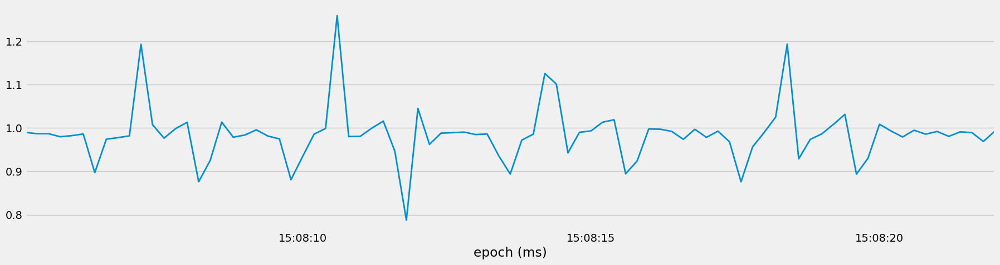

In [79]:
bench_set["acc_r"].plot()

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


<Axes: xlabel='epoch (ms)'>

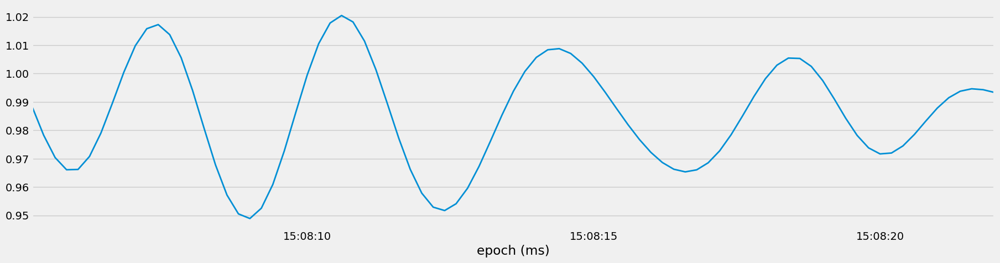

In [80]:
column = "acc_r"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

In [81]:
column= "acc_r"

In [82]:
data = LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)

argrelextrema(data[column + "_lowpass"].values, np.greater)

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


(array([11, 27, 46, 66, 82]),)

In [83]:
data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_y_lowpass,acc_x_lowpass,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002,0.974240,0.014263,0.988259
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197,0.953459,0.009929,0.978261
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686,0.936471,0.001969,0.970383
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906,0.925893,-0.012276,0.966086
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252,0.923233,-0.034117,0.966202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,64,0.980683,1.878567,0.982579,-0.036194,0.991480
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,64,0.991056,1.610252,0.986070,-0.041040,0.993773
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,64,0.989413,1.742013,0.986568,-0.045538,0.994629


In [86]:
data[column + "_lowpass"].values

array([0.98825897, 0.97826104, 0.97038251, 0.96608572, 0.96620206,
       0.97077633, 0.97904878, 0.98958003, 1.0004977 , 1.00982146,
       1.01580858, 1.01725862, 1.01372394, 1.00559022, 0.99401492,
       0.9807366 , 0.96778969, 0.95717407, 0.95053447, 0.94890148,
       0.95253411, 0.96088691, 0.97270434, 0.98622486, 0.99946037,
       1.01050469, 1.01782083, 1.02046097, 1.01818533, 1.01146453,
       1.00137073, 0.9893825 , 0.9771421 , 0.96620937, 0.95785286,
       0.95290732, 0.95171121, 0.95412147, 0.95959046, 0.96728258,
       0.97620727, 0.98534846, 0.99377648, 1.00073421, 1.00569369,
       1.00838204, 1.00877746, 1.00707768, 1.0036464 , 0.99894646,
       0.99347156, 0.98768918, 0.98200529, 0.97675545, 0.972219  ,
       0.96864526, 0.96627577, 0.96534689, 0.96606325, 0.96854331,
       0.97274973, 0.97842708, 0.98507198, 0.99195588, 0.9982083 ,
       1.00295169, 1.00546263, 1.0053236 , 1.00252772, 0.99750717,
       0.99107291, 0.98427427, 0.97820608, 0.9738046 , 0.97167

In [87]:
argrelextrema(data[column + "_lowpass"].values, np.greater)

(array([11, 27, 46, 66, 82]),)

In [88]:
def count_reps(dataset, cutoff=0.4, order=10, column="acc_r"):    
    # column = "acc_r"
    data = LowPass.low_pass_filter(
        dataset, col=column, sampling_frequency=fs, cutoff_frequency=cutoff, order=order
    )
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    fig , ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"], "o", color="red")    
    ax.set_ylabel(f"{column}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)} Reps")
    plt.show()
    return len(peaks)

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


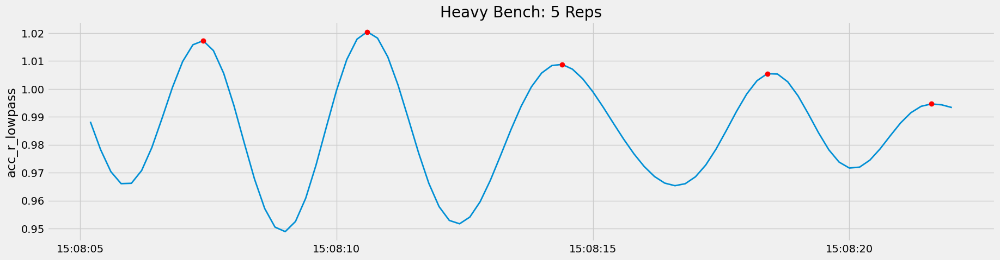

5

In [89]:
count_reps(bench_set, cutoff=0.4)

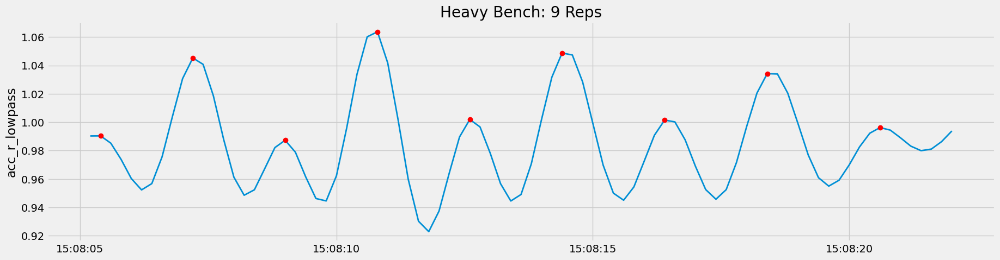

9

In [90]:
count_reps(bench_set, cutoff=0.6)

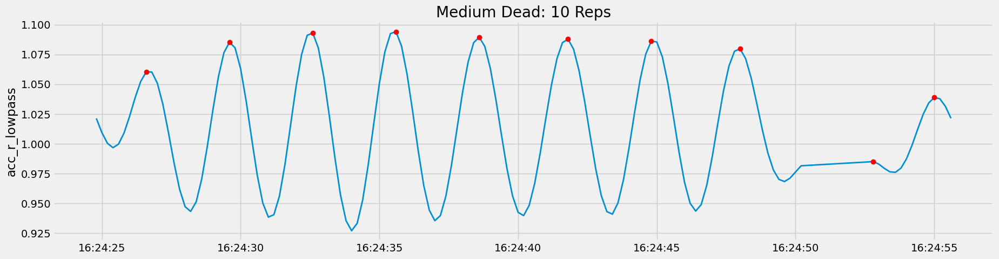

10

In [91]:
count_reps(dead_set, cutoff=0.4)

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


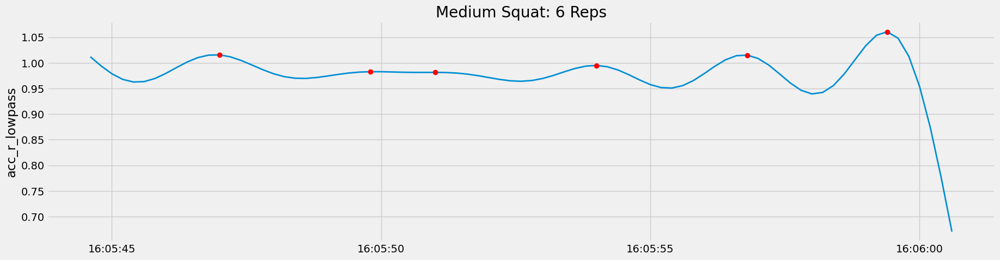

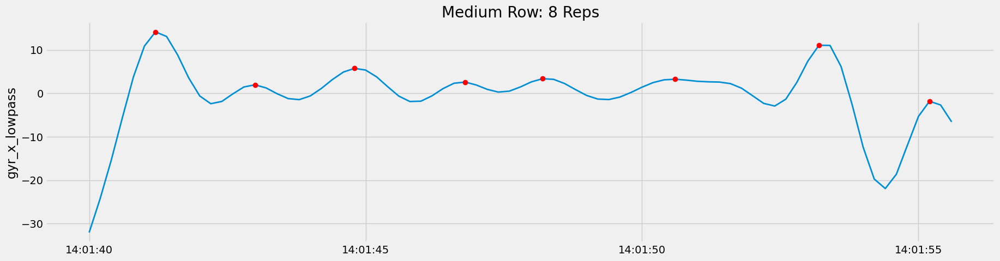

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


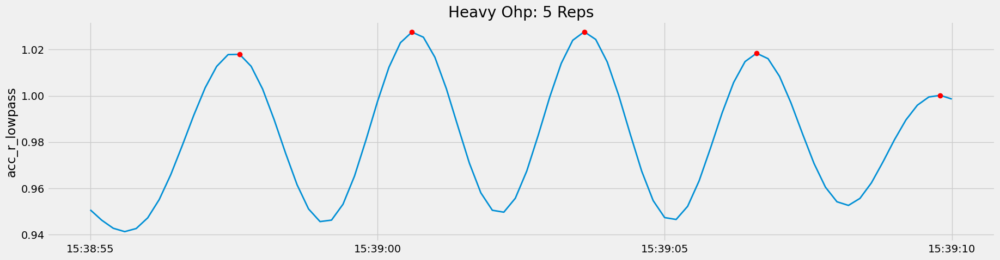

5

In [92]:
count_reps(squat_set, cutoff=0.35)
count_reps(row_set, cutoff=0.6, column="gyr_x")
count_reps(ohp_set, cutoff=0.35)

In [94]:
df.loc[:, "reps"] = df["category"].apply(lambda x: 5 if x == "heavy" else 10)

In [95]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,reps
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,64,0.989783,1.796002,5
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,64,0.986789,1.699197,5
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,64,0.986811,1.713686,5
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,64,0.979856,3.077906,5
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,64,0.982320,2.150252,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,71,1.022452,2.409237,10
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,71,1.016059,1.900370,10
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,71,1.017838,2.422680,10


In [96]:
df.loc[:, "reps"]

epoch (ms)
2019-01-11 15:08:05.200     5
2019-01-11 15:08:05.400     5
2019-01-11 15:08:05.600     5
2019-01-11 15:08:05.800     5
2019-01-11 15:08:06.000     5
                           ..
2019-01-20 17:33:27.000    10
2019-01-20 17:33:27.200    10
2019-01-20 17:33:27.400    10
2019-01-20 17:33:27.600    10
2019-01-20 17:33:27.800    10
Name: reps, Length: 7899, dtype: int64

In [97]:
rep_df = df.groupby(["label", "category", "set"])["reps"].max().reset_index()

In [98]:
rep_df

,label,category,set,reps
0,bench,heavy,5,5
1,bench,heavy,7,5
2,bench,heavy,16,5
3,bench,heavy,23,5
4,bench,heavy,40,5
...,...,...,...,...
80,squat,medium,60,10
81,squat,medium,63,10
82,squat,medium,69,10
83,squat,medium,92,10


In [99]:
rep_df["press_pred"] = 0

In [100]:
rep_df

,label,category,set,reps,press_pred
0,bench,heavy,5,5,0
1,bench,heavy,7,5,0
2,bench,heavy,16,5,0
3,bench,heavy,23,5,0
4,bench,heavy,40,5,0
...,...,...,...,...,...
80,squat,medium,60,10,0
81,squat,medium,63,10,0
82,squat,medium,69,10,0
83,squat,medium,92,10,0


/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


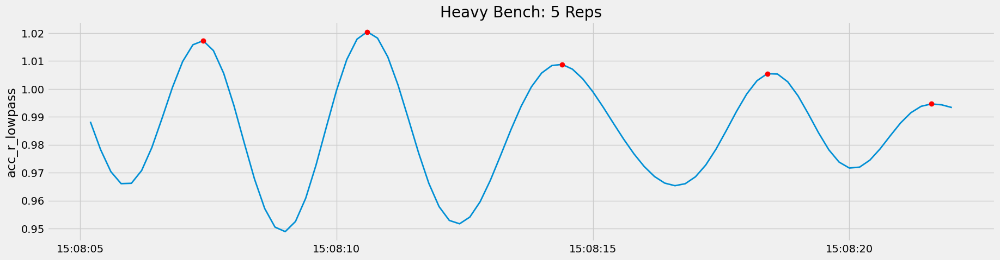

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


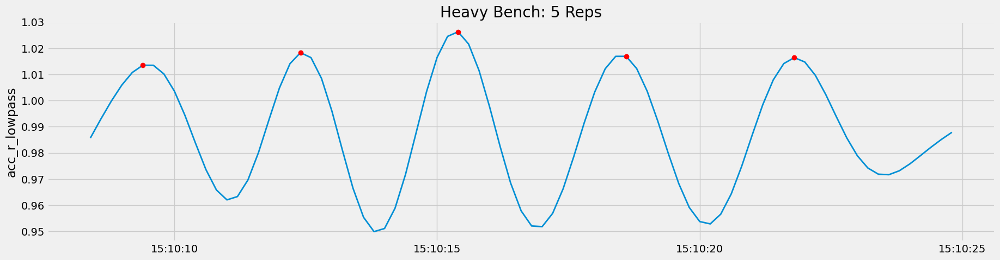

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


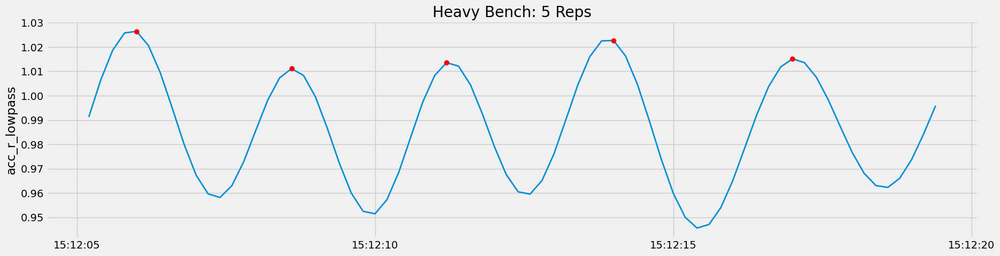

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


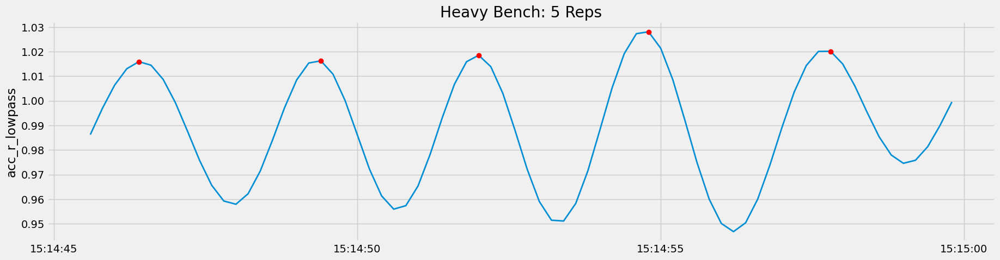

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


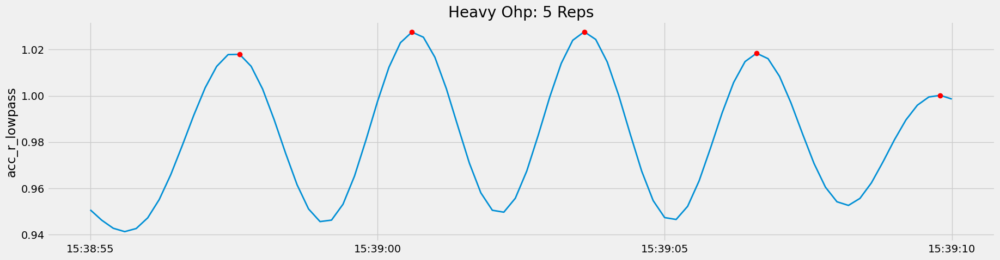

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


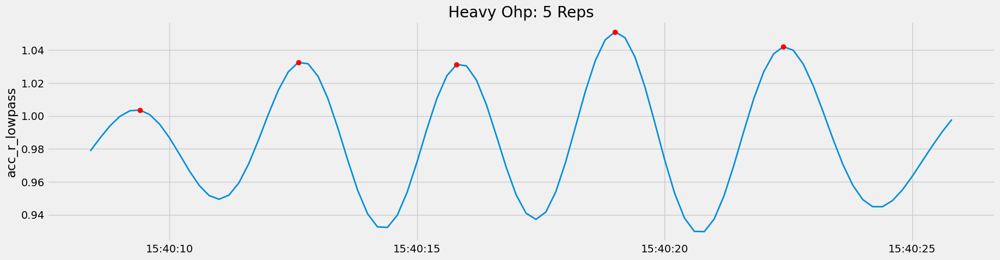

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


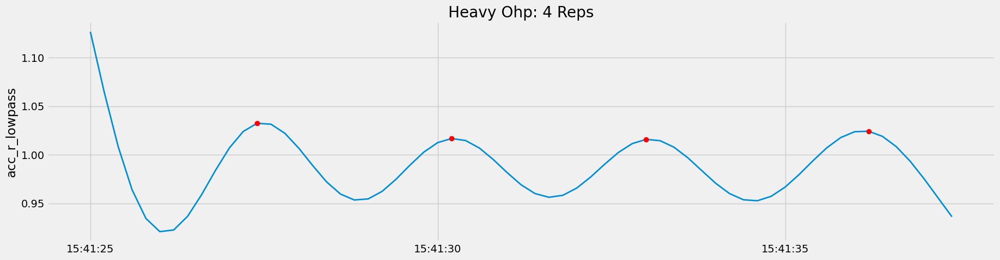

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


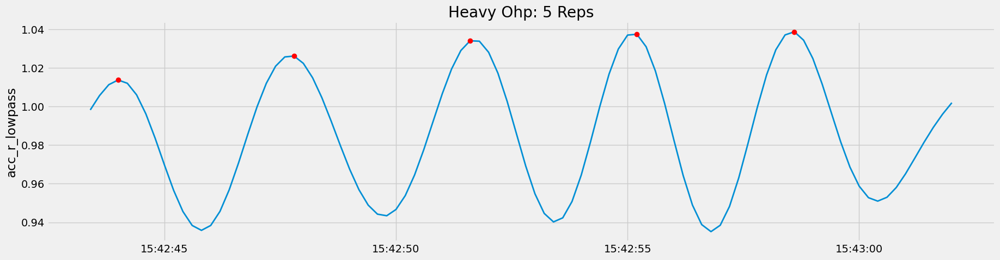

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


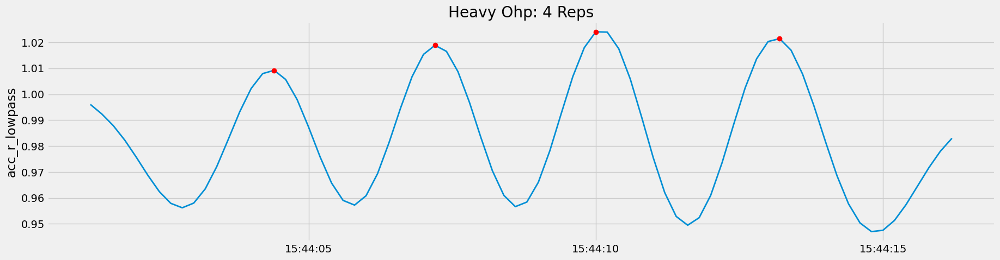

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


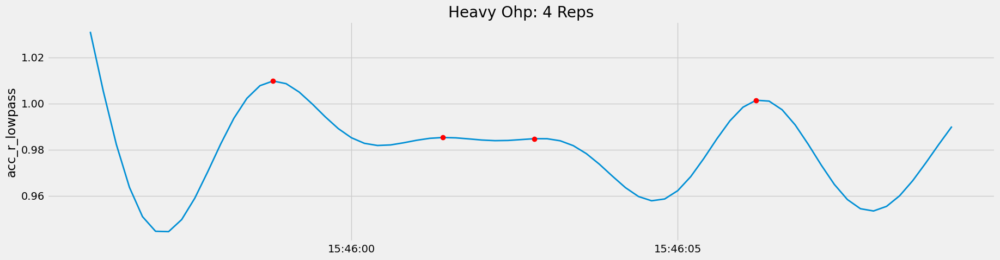

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


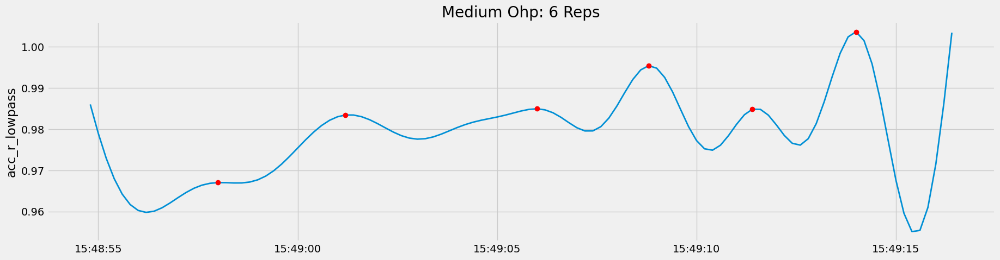

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


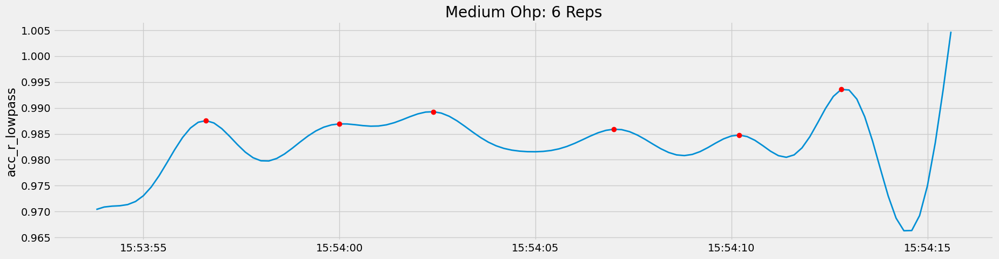

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


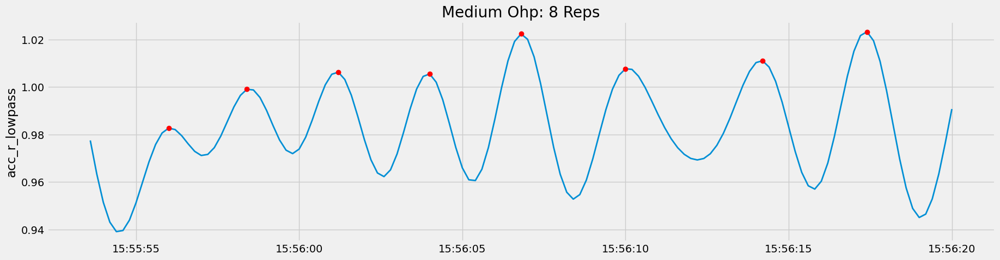

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


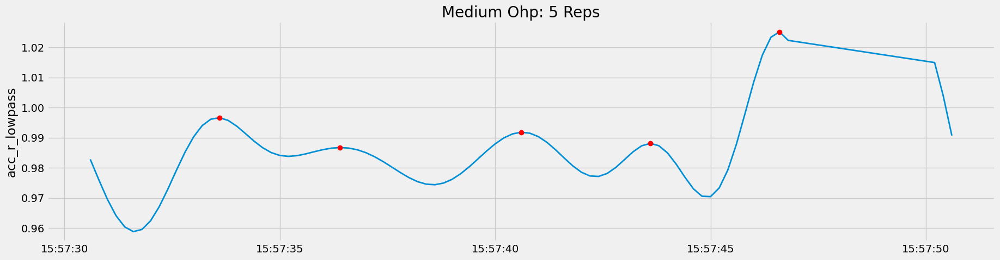

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


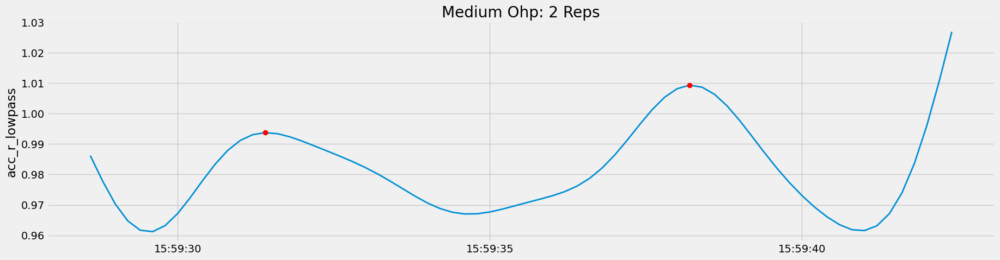

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


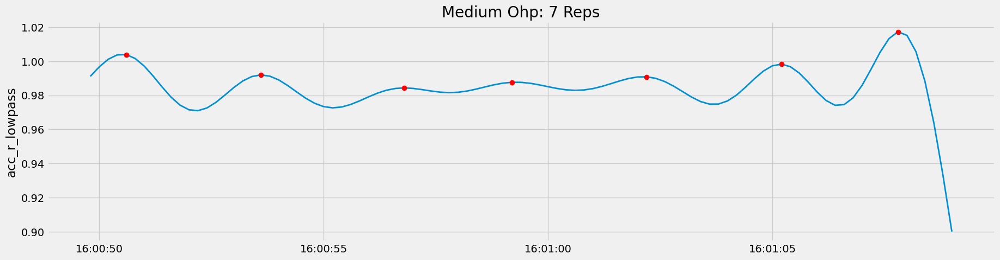

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


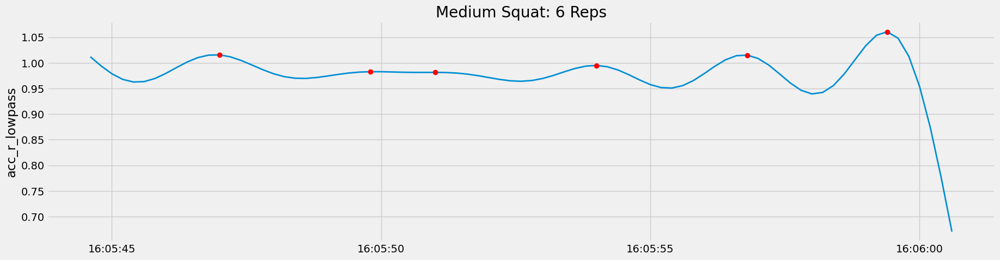

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


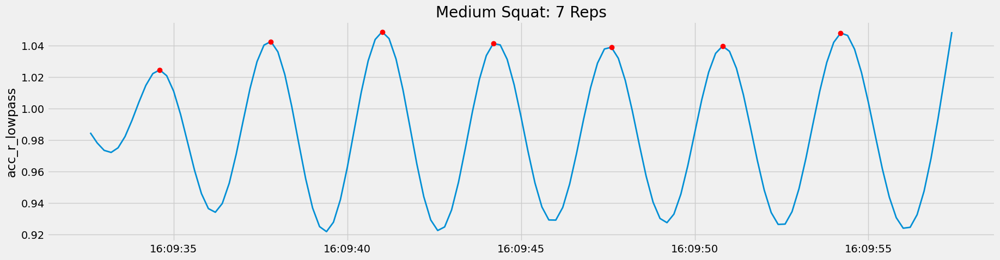

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


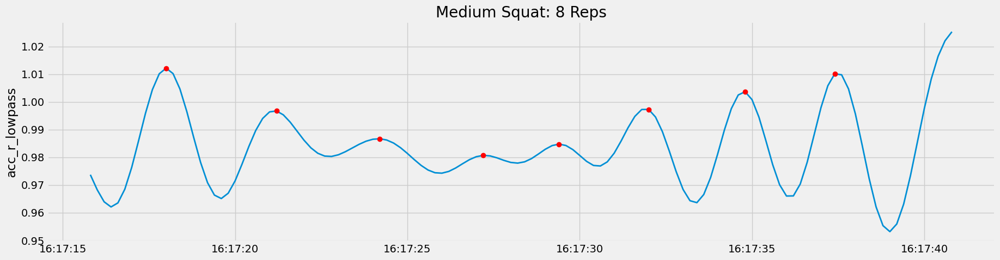

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


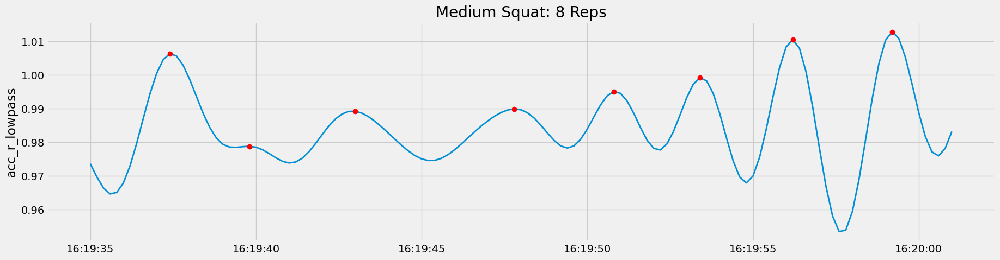

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


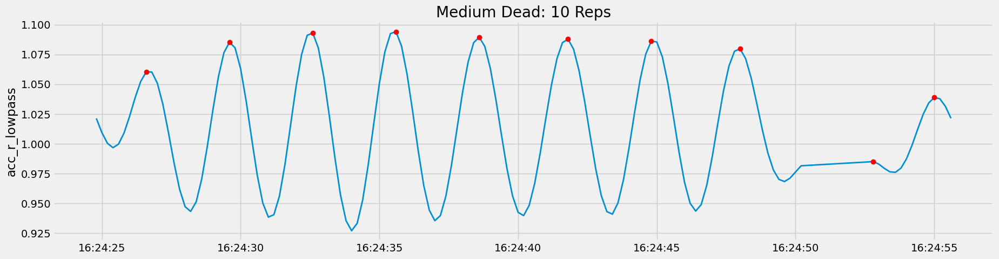

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


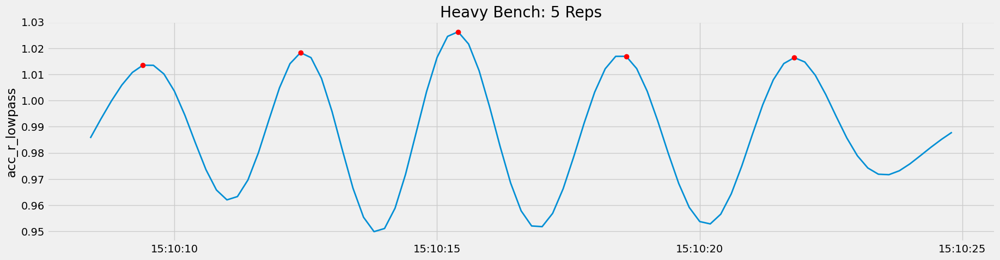

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


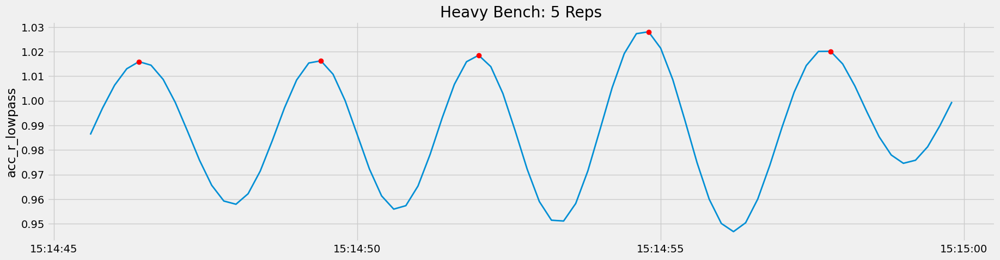

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


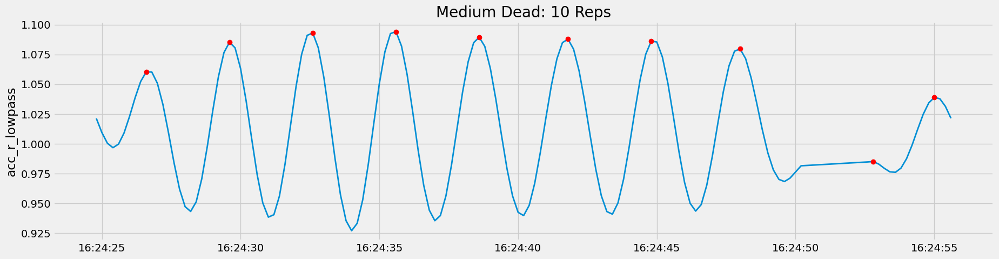

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


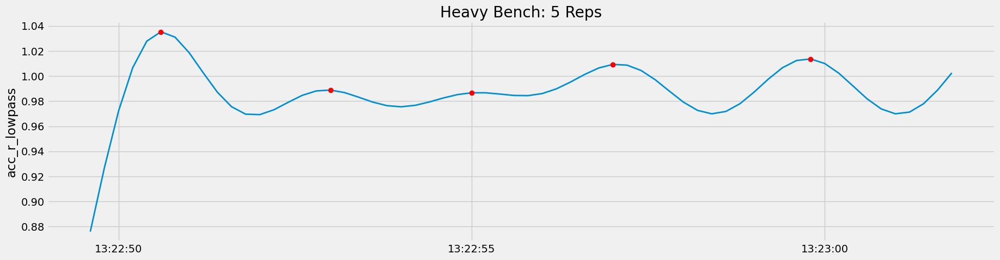

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


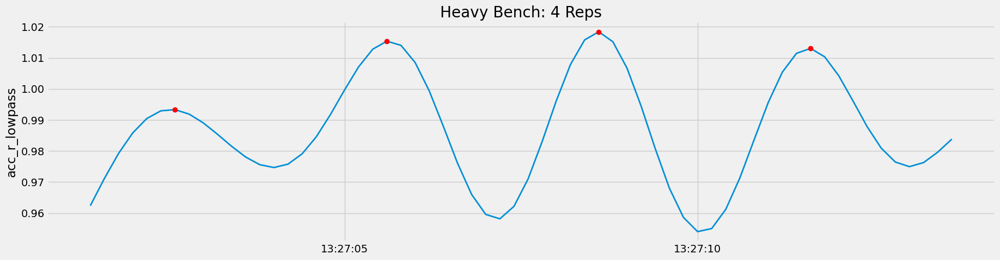

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


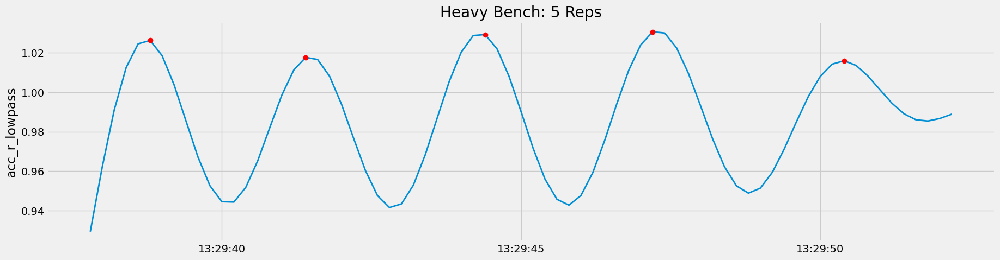

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


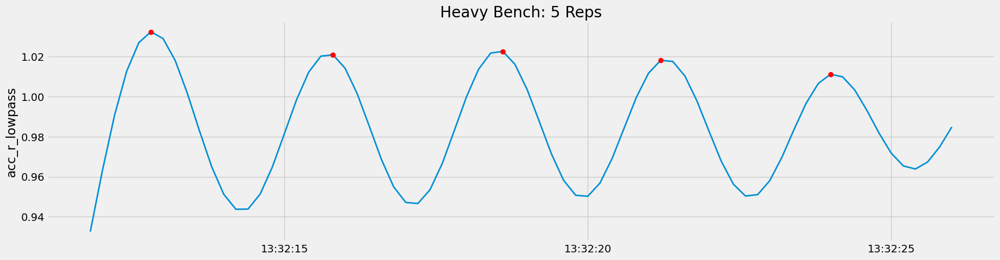

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


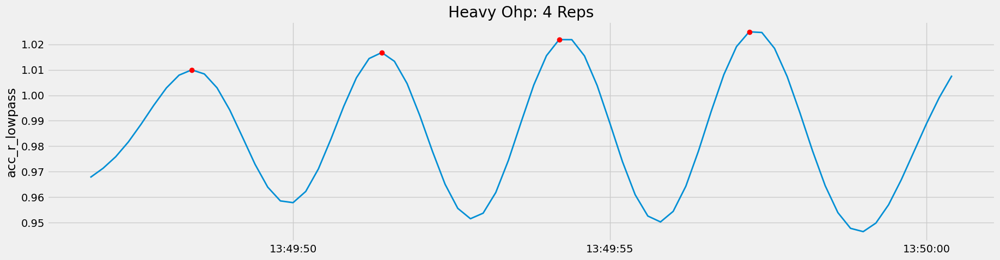

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


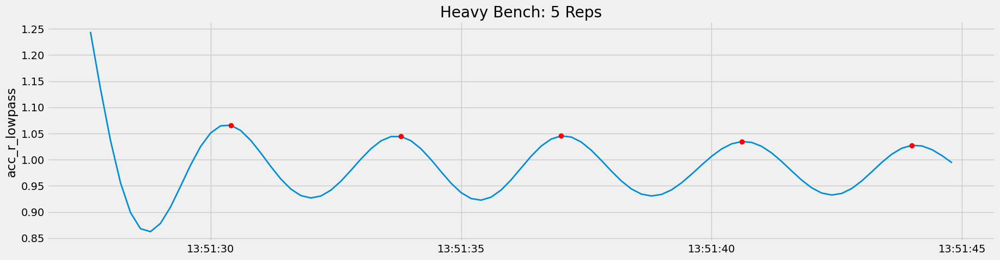

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


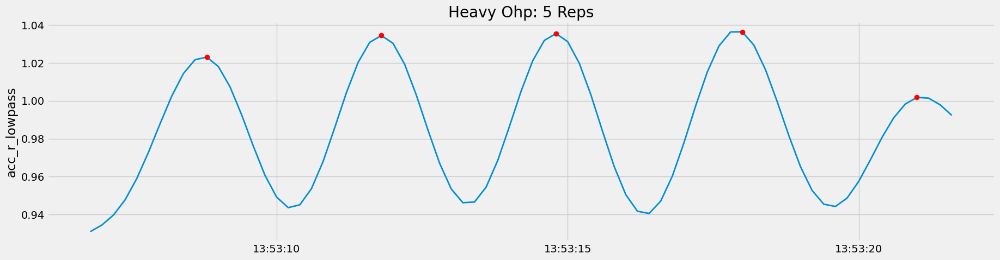

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


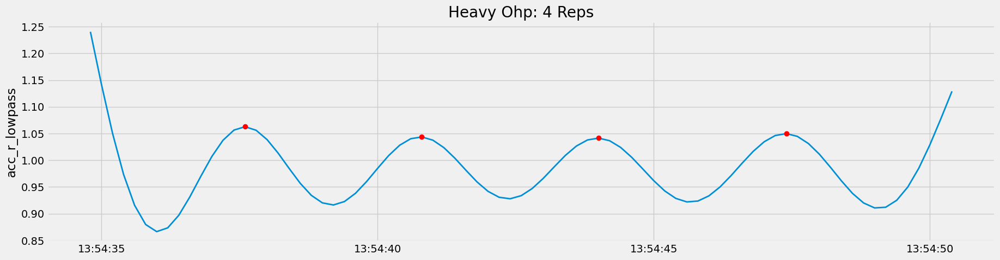

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


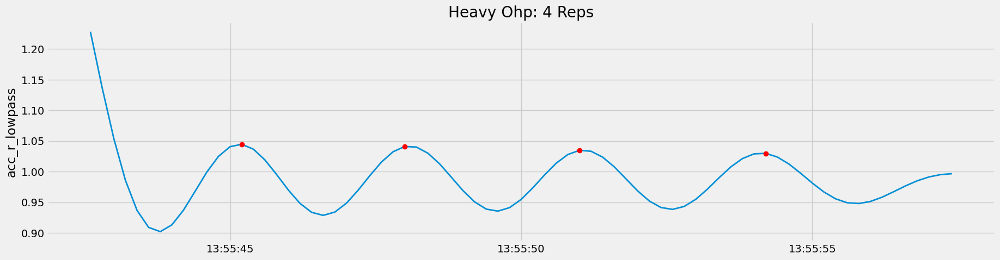

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


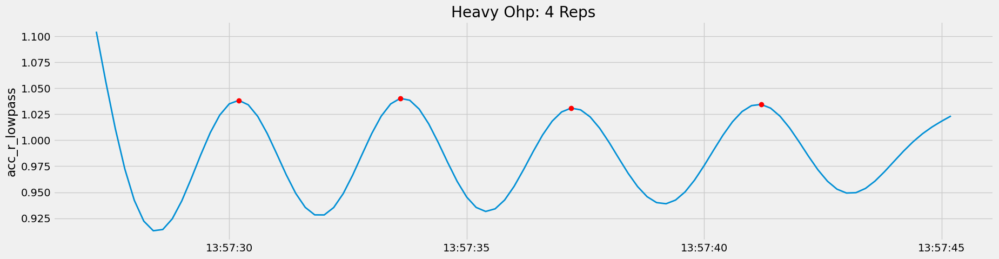

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


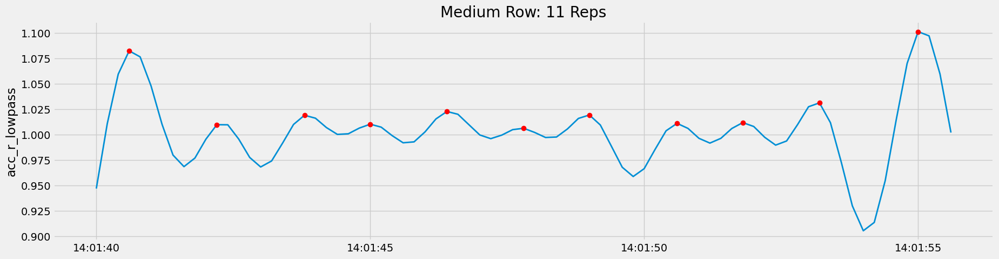

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


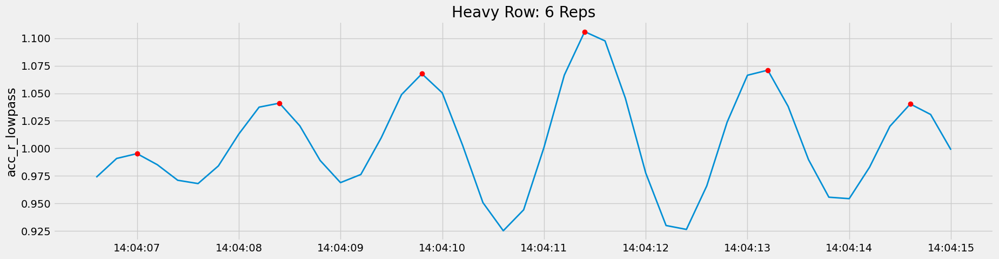

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


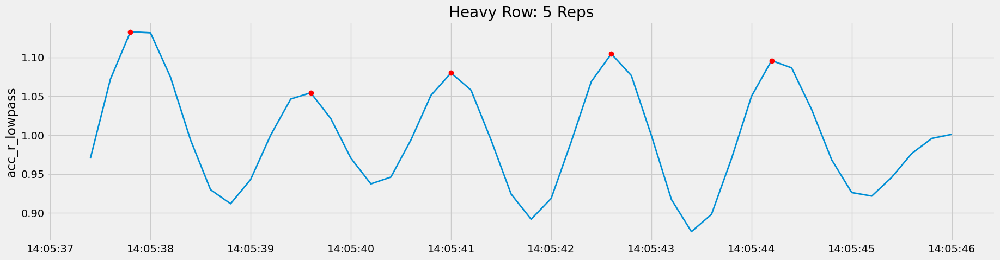

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


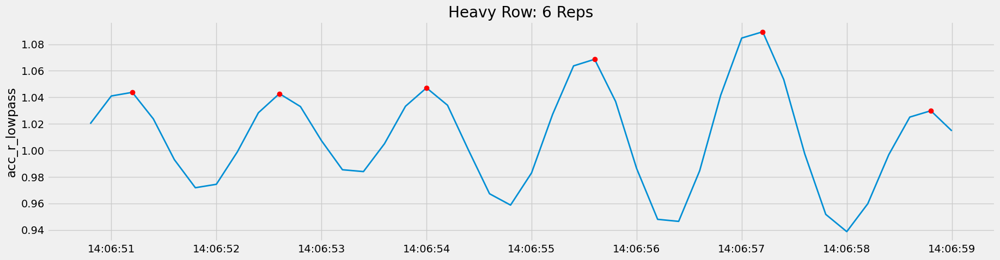

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


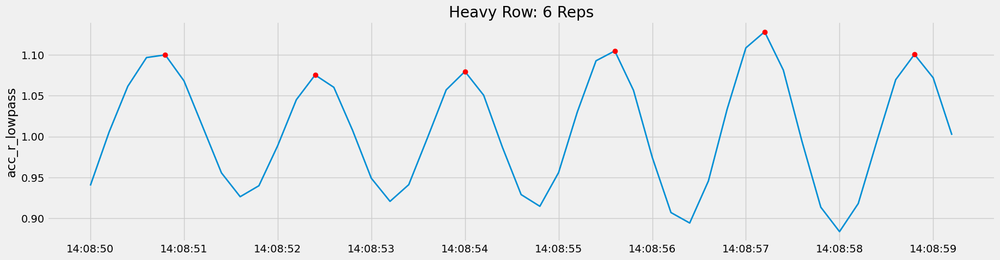

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


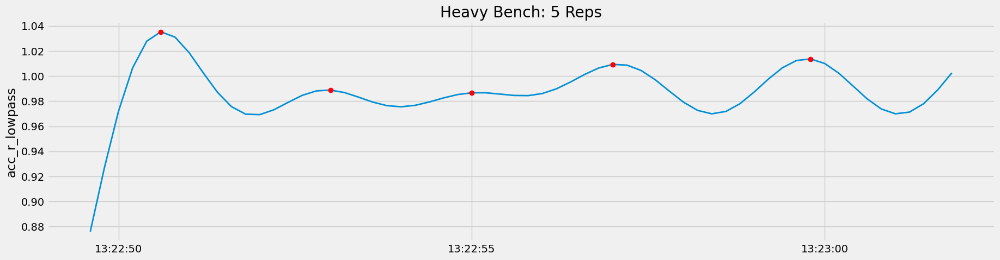

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


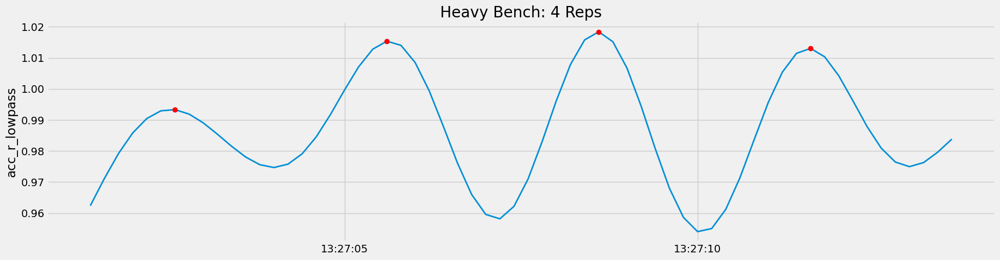

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


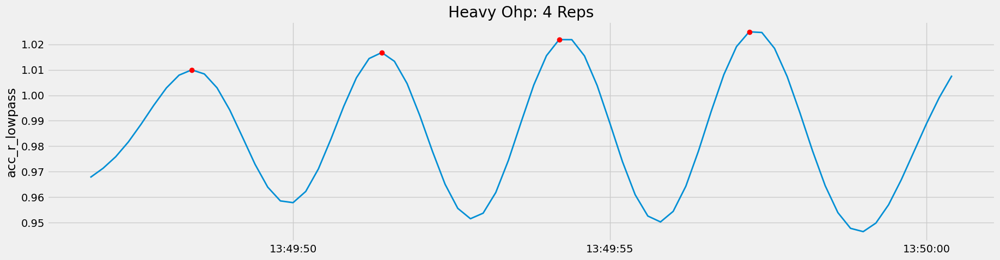

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


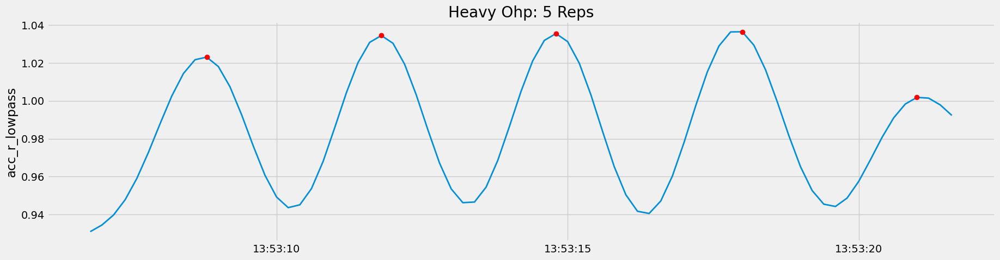

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


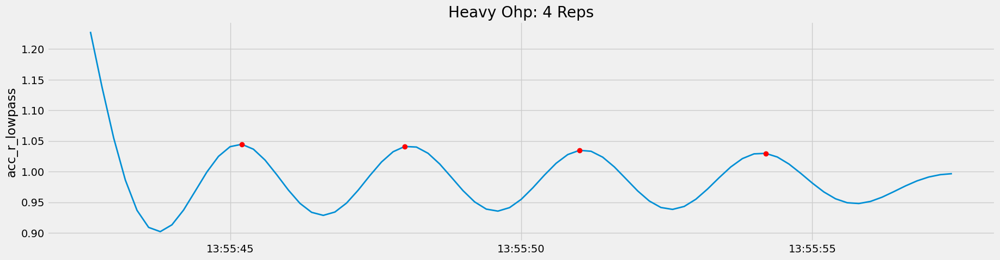

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


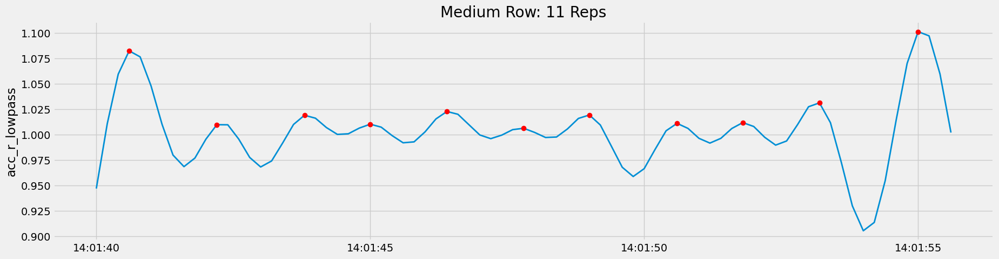

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


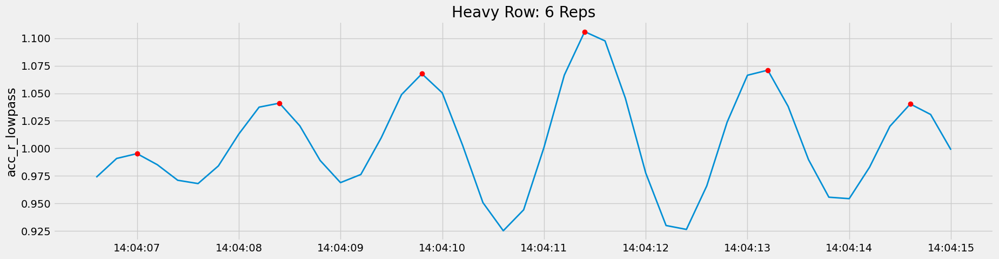

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


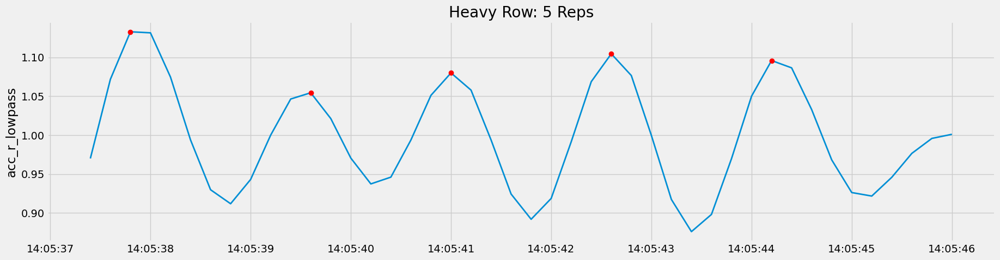

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


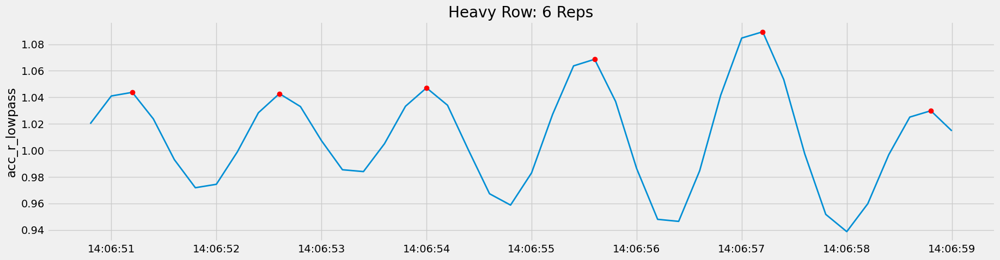

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


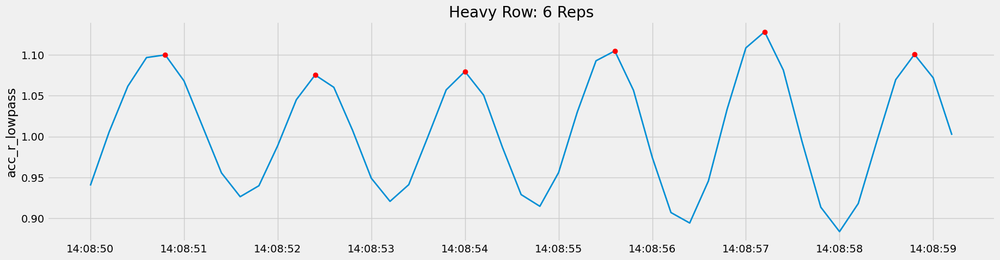

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


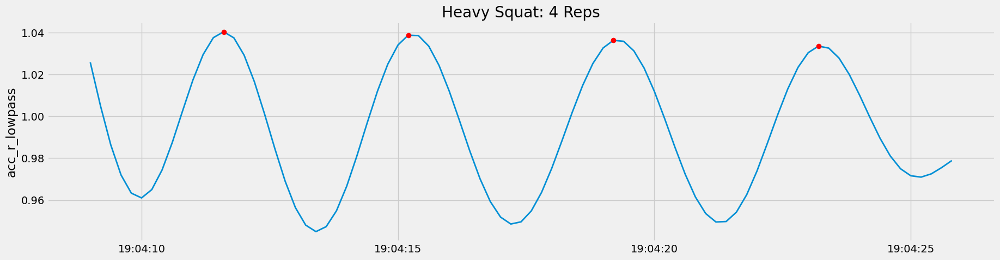

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


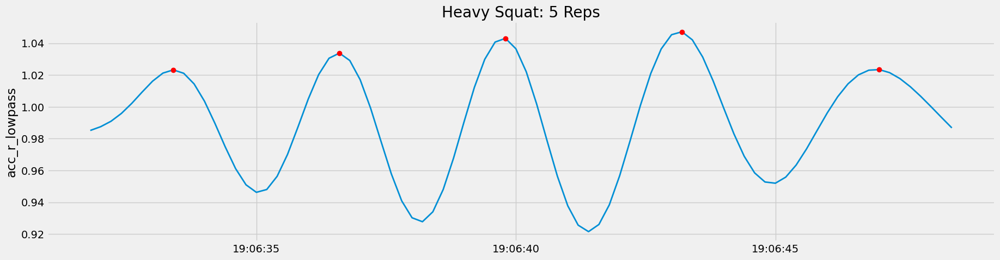

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


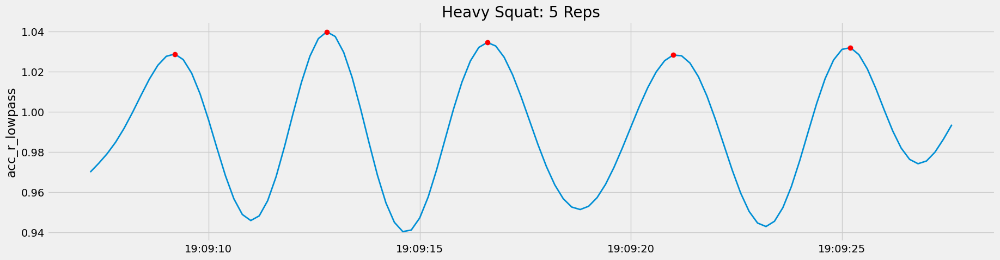

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


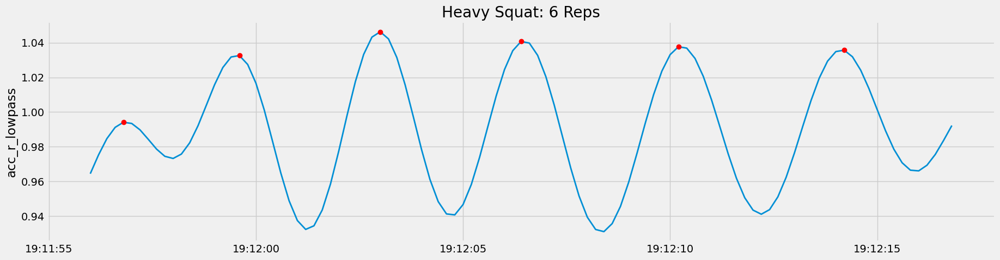

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


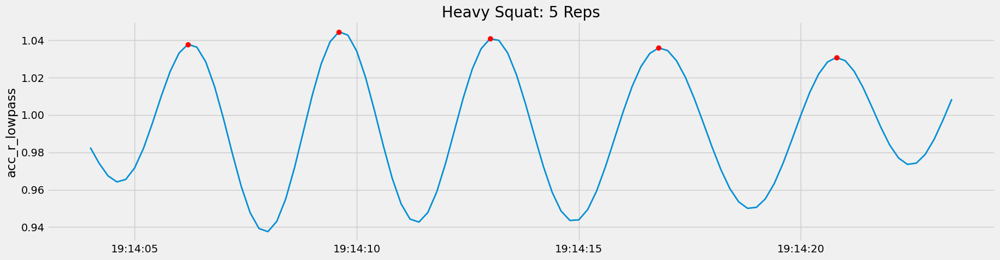

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


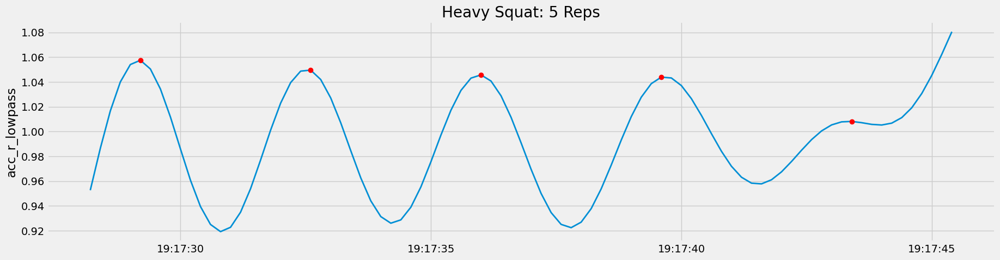

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


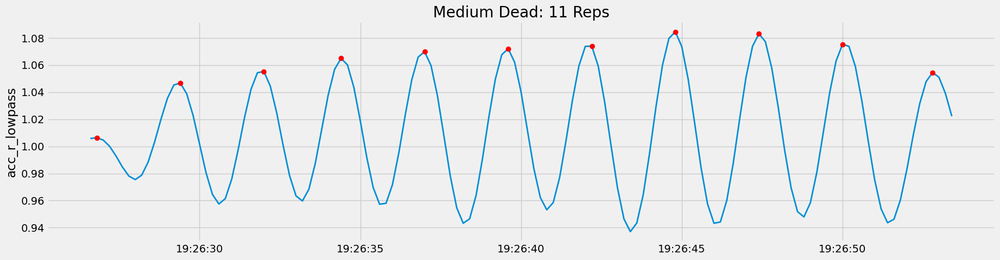

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


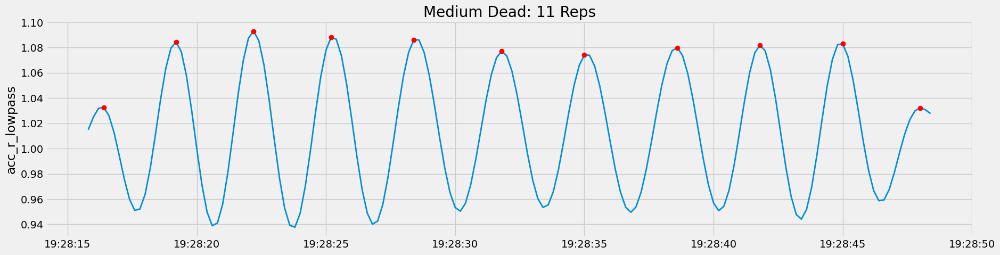

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


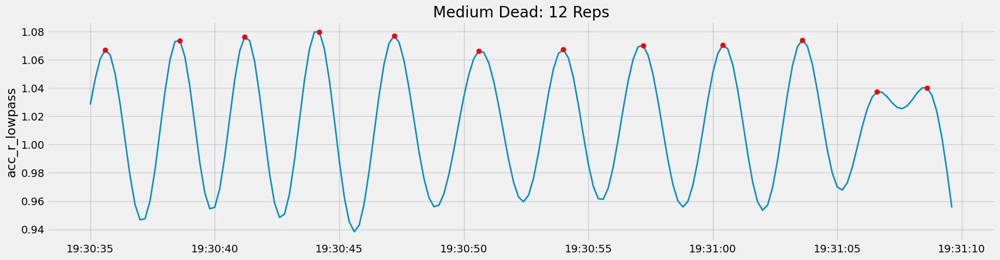

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


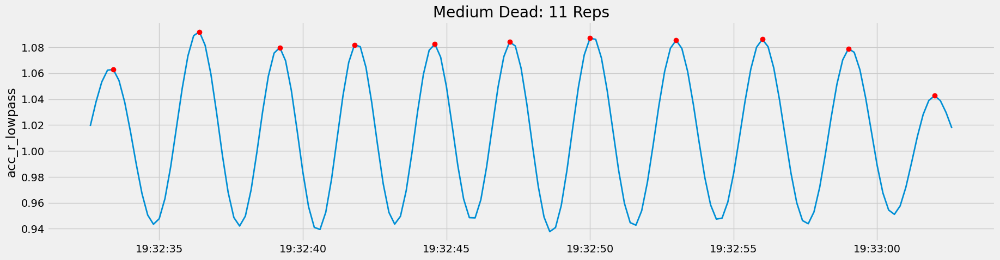

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


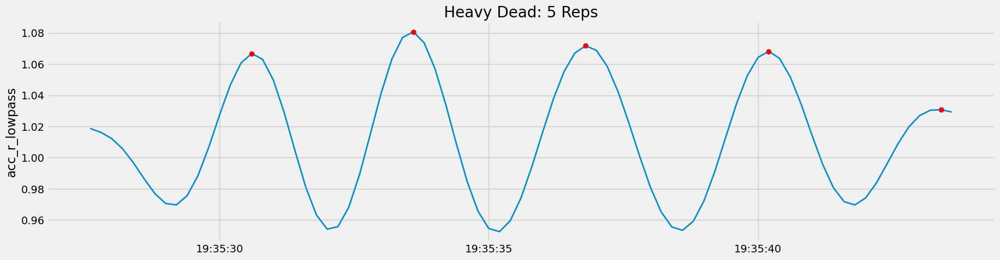

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


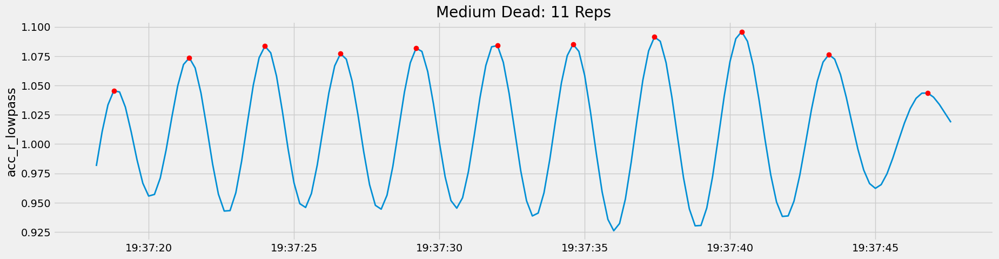

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


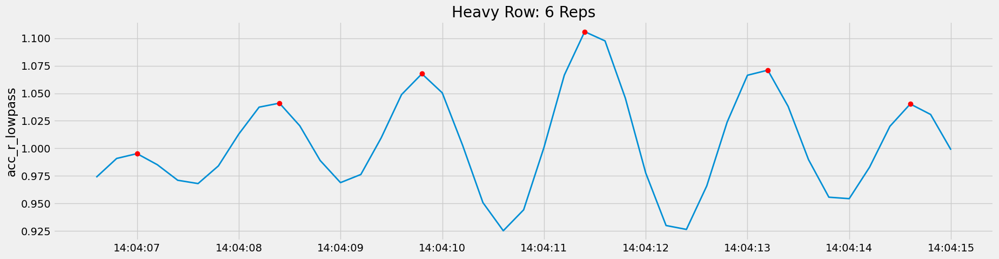

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


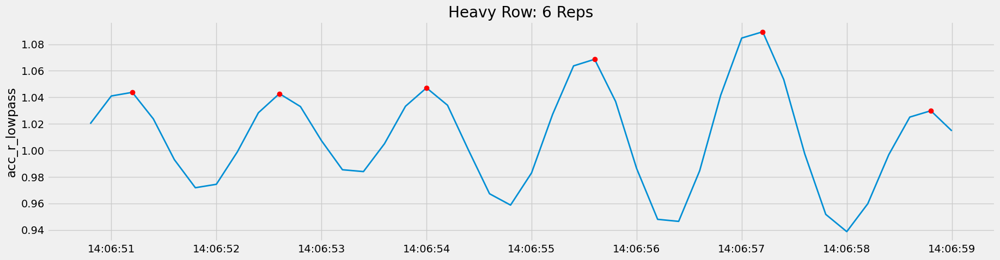

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


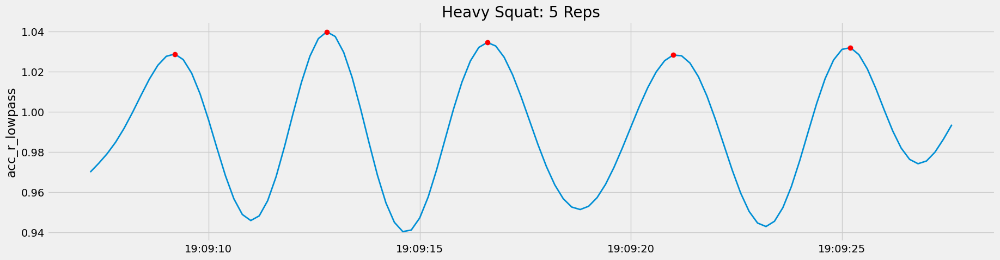

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


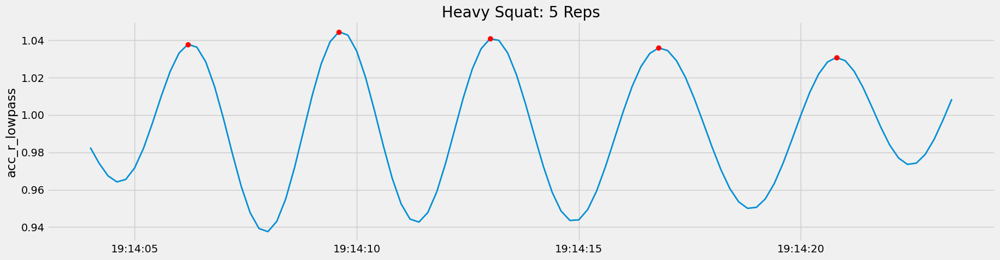

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


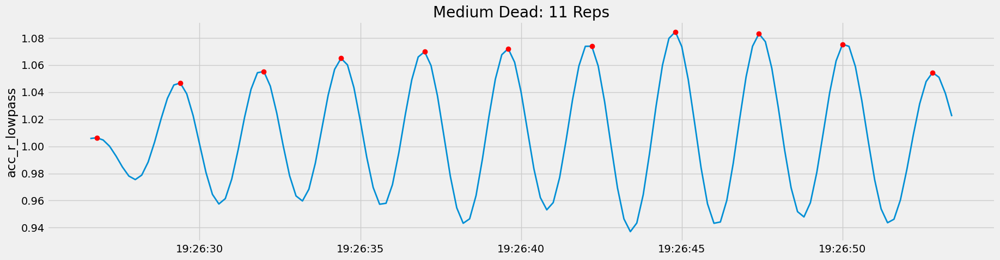

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


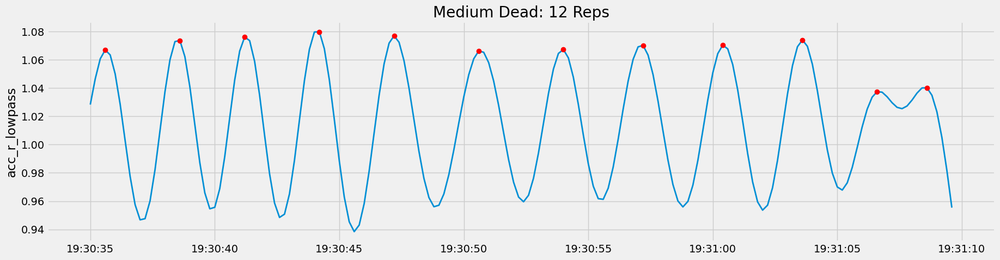

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


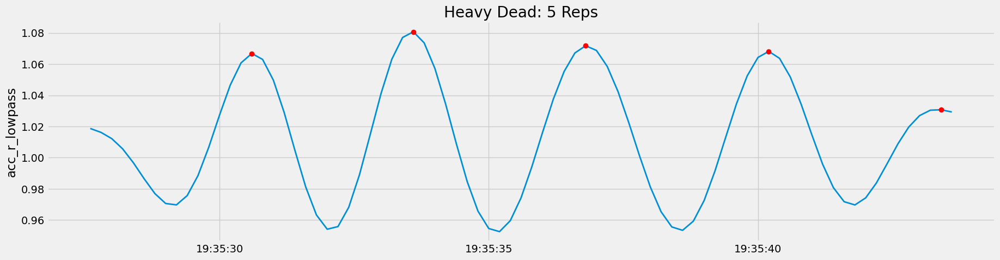

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


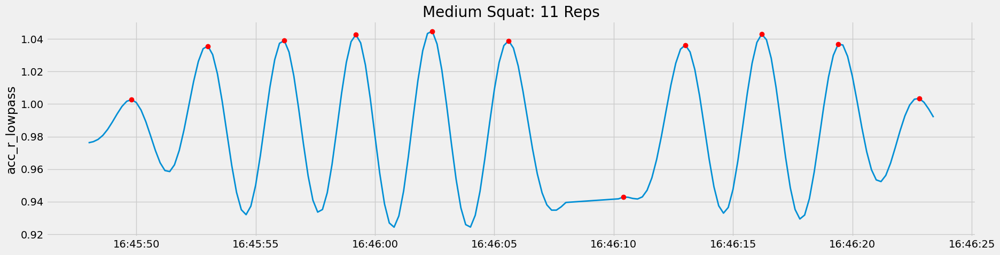

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


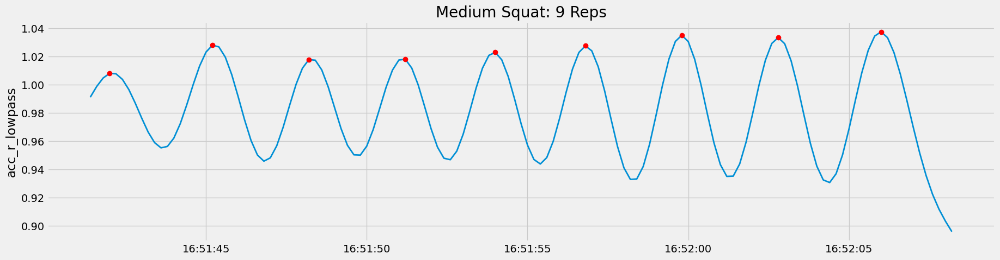

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


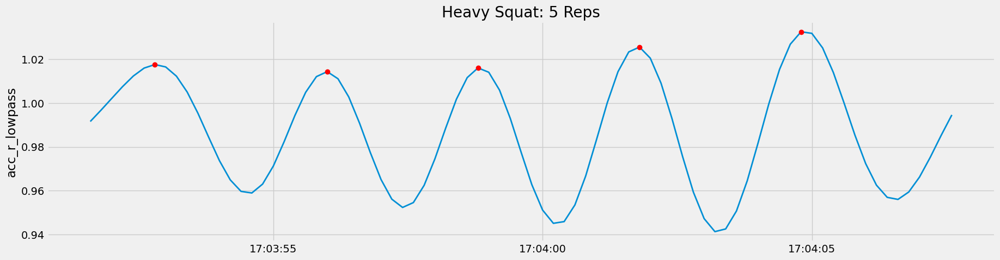

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


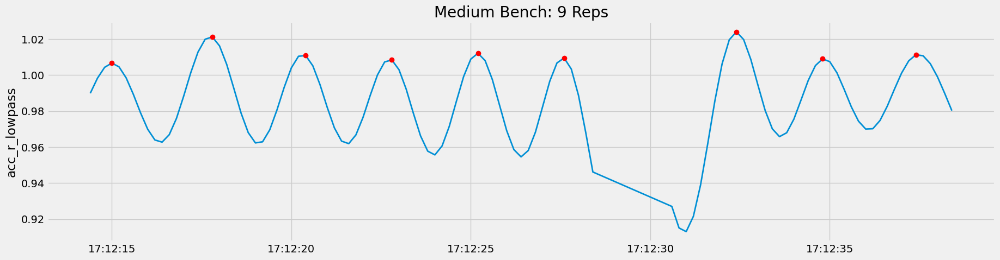

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


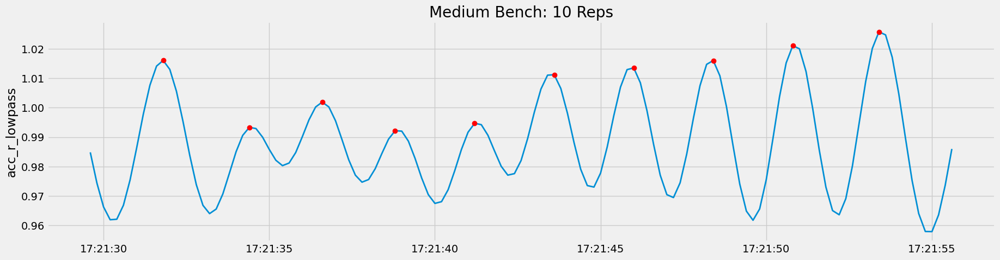

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


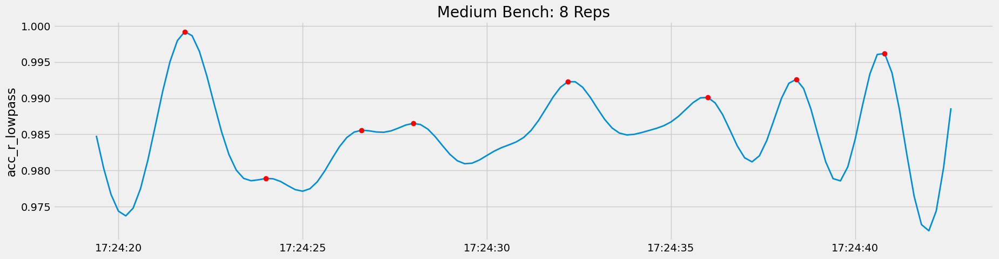

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


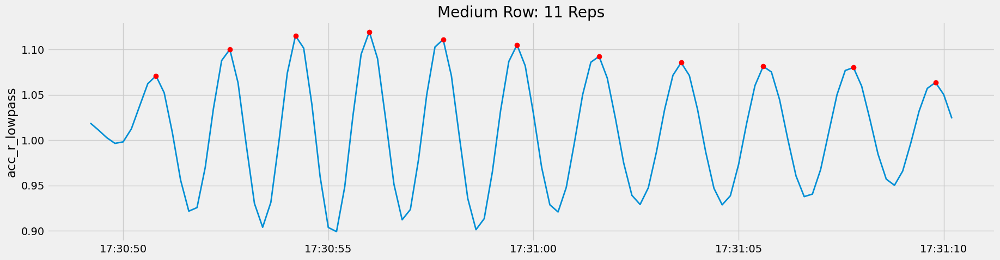

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


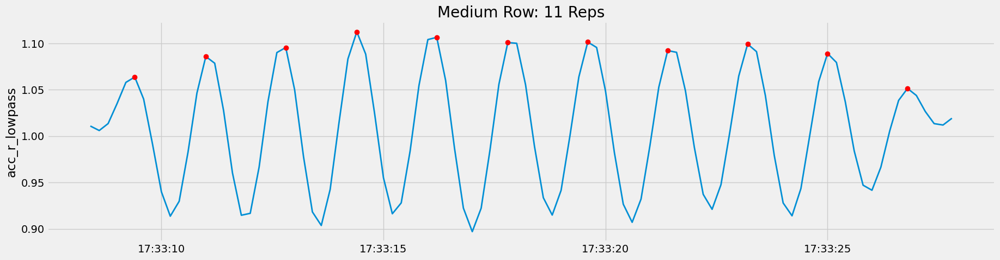

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


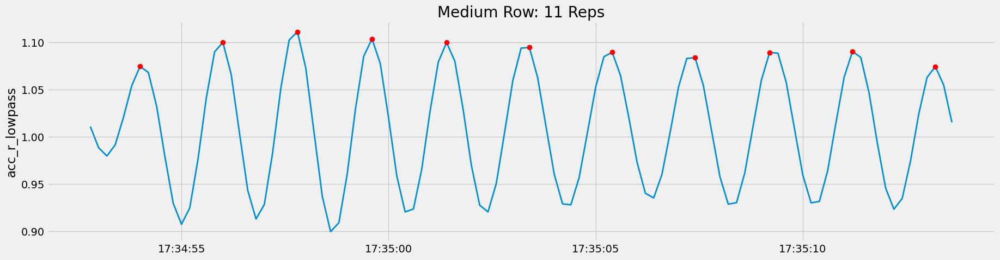

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


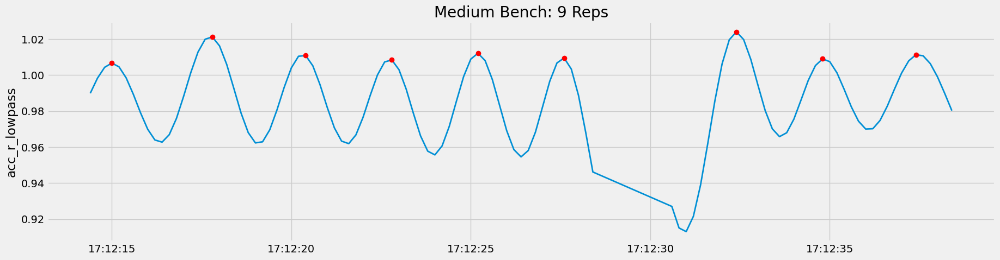

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


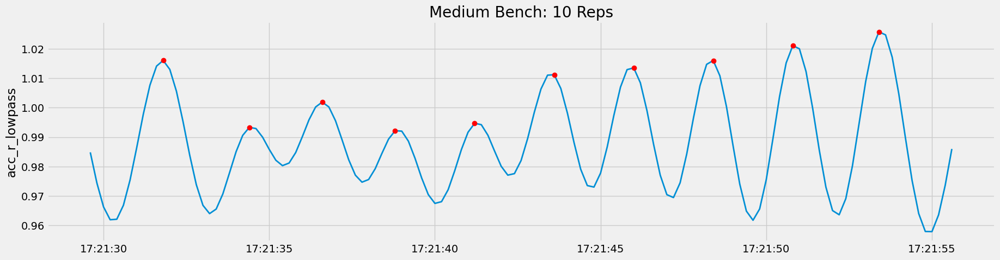

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


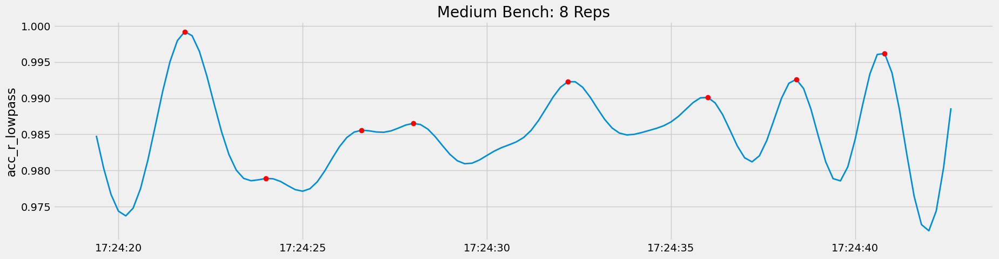

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


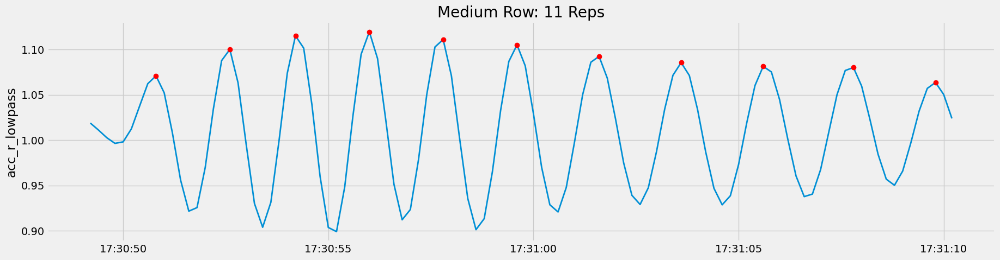

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


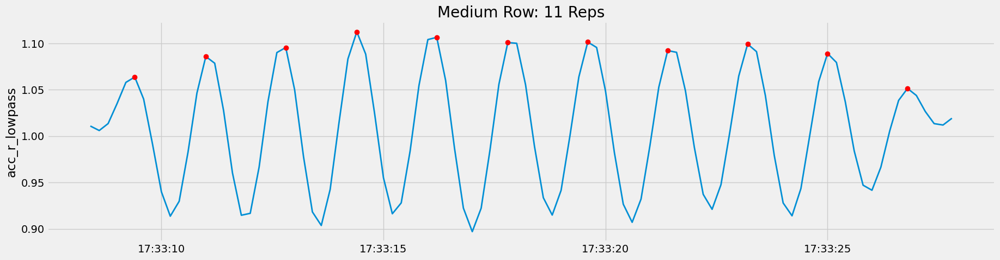

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


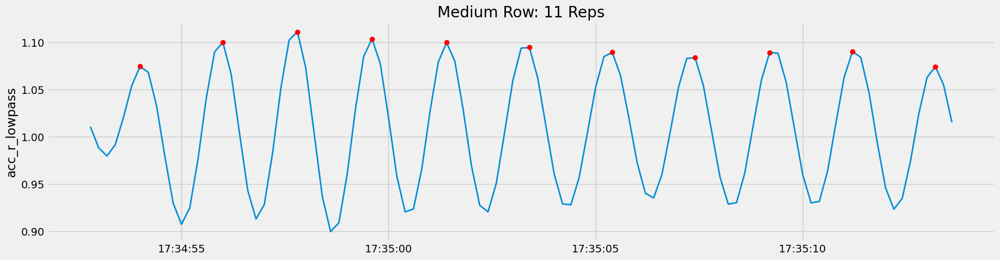

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


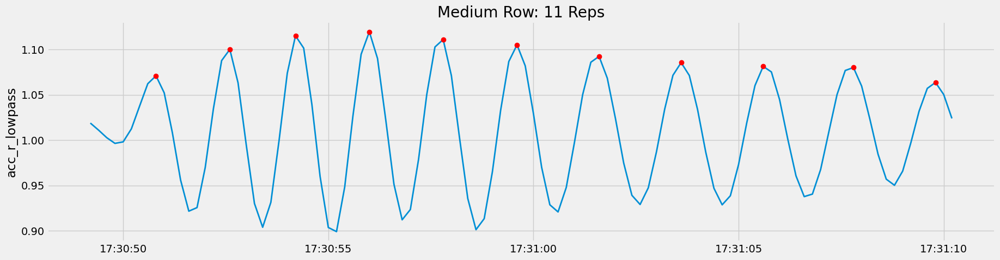

/Users/peter/Desktop/sample_project/tracking-barbell-exercises/src/features/DataTransformation.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_table[col + "_lowpass"] = filtfilt(b, a, data_table[col])


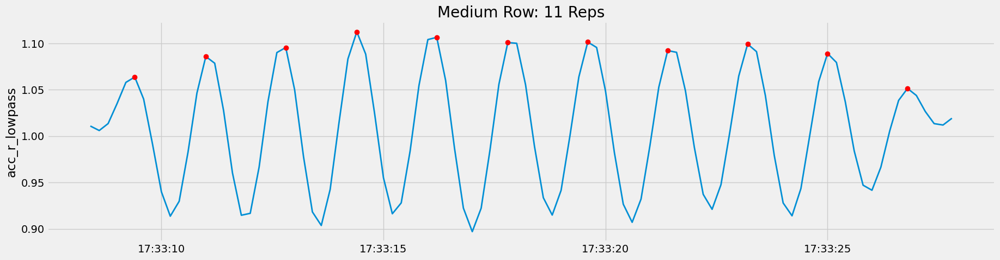

In [102]:
for s in df["set"].unique():
    subset = df[df["set"] == s]
    column = "acc_r"
    cutoff = 0.4
    if subset["label"].iloc[0] == "squat":
        cutoff = 0.35
    if subset["label"].iloc[0] == "row":
        cutoff = 0.65
    if subset["label"].iloc[0] == "ohp":
        cutoff = 0.35
    reps = count_reps(subset, cutoff=cutoff, column=column)
    rep_df.loc[rep_df["set"] == s, "pres_pred"] = reps

In [103]:
rep_df

,label,category,set,reps,press_pred,pres_pred
0,bench,heavy,5,5,0,4.0
1,bench,heavy,7,5,0,5.0
2,bench,heavy,16,5,0,5.0
3,bench,heavy,23,5,0,5.0
4,bench,heavy,40,5,0,5.0
...,...,...,...,...,...,...
80,squat,medium,60,10,0,8.0
81,squat,medium,63,10,0,7.0
82,squat,medium,69,10,0,6.0
83,squat,medium,92,10,0,8.0


In [104]:
error = mean_absolute_error(rep_df["reps"], rep_df["pres_pred"]).round(2)

In [105]:
error

1.0

<Axes: xlabel='label,category'>

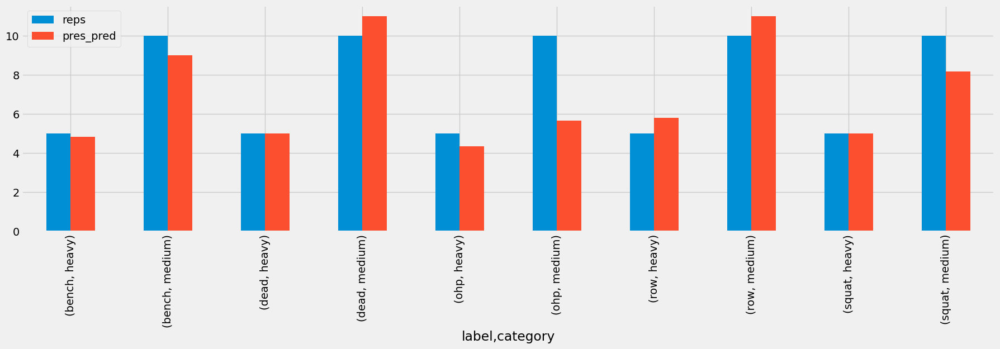

In [106]:
rep_df.groupby(["label", "category"])[["reps", "pres_pred"]].mean().plot.bar()